# Radiología multimodal con MedGemma y Gemini

**Explicación:** Notebook académico para Anaconda y Jupyter Notebook, orientado a análisis de imágenes radiológicas, evaluación cuantitativa, generación de gráficas, persistencia local del modelo y síntesis de voz.

El flujo contempla una GPU NVIDIA GTX 1650 Ti con memoria limitada. La carga del modelo prioriza cuantización de 4 bits cuando `bitsandbytes` se encuentra disponible.

Las métricas diagnósticas supervisadas se calculan únicamente cuando existe un archivo `labels.csv` con etiquetas reales. En ausencia de etiquetas, el notebook presenta métricas operativas, estadísticas del dataset y métricas de generación sin atribuirles validez clínica.


In [4]:
# ============================================================
# CELDA 1: Verificación del entorno
# Explicación:
# Comprueba Python, PyTorch, CUDA, GPU disponible y memoria gráfica antes de iniciar el procesamiento.
# ============================================================

import os
import sys
import platform
from pathlib import Path

import torch

print("Python:", sys.version.split()[0])
print("Sistema operativo:", platform.platform())
print("PyTorch:", torch.__version__)
print("CUDA compilada en PyTorch:", torch.version.cuda)
print("CUDA disponible:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    total_vram = torch.cuda.get_device_properties(0).total_memory / 1024**3
    print("VRAM total (GB):", round(total_vram, 2))
else:
    print("Dispositivo de ejecución: CPU")


Python: 3.11.16
Sistema operativo: Windows-10-10.0.26200-SP0
PyTorch: 2.6.0+cu118
CUDA compilada en PyTorch: 11.8
CUDA disponible: False
Dispositivo de ejecución: CPU


In [5]:
# ============================================================
# CELDA 2: Importación de librerías
# Explicación:
# Carga las bibliotecas necesarias para inferencia multimodal, visualización, métricas, persistencia, audio e interfaz gráfica.
# ============================================================

import os
import io
import re
import json
import time
import wave
import shutil
import tempfile
import contextlib
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageStat

import torch
from transformers import (
    AutoProcessor,
    AutoModelForImageTextToText,
    BitsAndBytesConfig
)

from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    confusion_matrix,
    classification_report
)

from dotenv import load_dotenv
from google import genai
from google.genai import types
import soundfile as sf
import gradio as gr


In [6]:
# ============================================================
# CELDA 3: Configuración general del proyecto
# Explicación:
# Define las rutas de trabajo, carpetas de salida, parámetros del modelo y cantidad máxima de muestras para evaluación.
# ============================================================

PROJECT_DIR = Path(r"C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1")
DATASET_DIR = PROJECT_DIR / "data"
OUTPUT_DIR = PROJECT_DIR / "outputs"
FIGURES_DIR = OUTPUT_DIR / "figuras"
REPORTS_DIR = OUTPUT_DIR / "reportes"
LOCAL_MODEL_DIR = PROJECT_DIR / "modelos_locales" / "medgemma_4b"
OFFLOAD_DIR = PROJECT_DIR / "offload_medgemma"

for directory in [
    DATASET_DIR,
    OUTPUT_DIR,
    FIGURES_DIR,
    REPORTS_DIR,
    LOCAL_MODEL_DIR.parent,
    OFFLOAD_DIR
]:
    directory.mkdir(parents=True, exist_ok=True)

MODEL_ID = "google/medgemma-4b-it"
GEMINI_TTS_MODEL = "gemini-2.5-flash-preview-tts"
MAX_EVAL_SAMPLES = 12
MAX_NEW_TOKENS = 256
SEED = 42

np.random.seed(SEED)
torch.manual_seed(SEED)

print("Directorio del proyecto:", PROJECT_DIR)
print("Directorio del dataset:", DATASET_DIR)
print("Directorio de resultados:", OUTPUT_DIR)
print("Directorio de figuras:", FIGURES_DIR)
print("Directorio del modelo local:", LOCAL_MODEL_DIR)


Directorio del proyecto: C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1
Directorio del dataset: C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1\data
Directorio de resultados: C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1\outputs
Directorio de figuras: C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1\outputs\figuras
Directorio del modelo local: C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1\modelos_locales\medgemma_4b


In [7]:
# ============================================================
# CELDA: Configuración de Gemini API
# Explicación:
# Carga de manera segura la clave de Gemini desde el archivo .env
# y configura el cliente para realizar solicitudes al modelo.
# ============================================================

import os
from dotenv import load_dotenv
from google import genai

# ------------------------------------------------------------
# 1. CARGAR VARIABLES DEL ARCHIVO .env
# ------------------------------------------------------------

load_dotenv()

# ------------------------------------------------------------
# 2. OBTENER LA CLAVE API DE GEMINI
# ------------------------------------------------------------

GEMINI_API_KEY = os.getenv("GEMINI_API_KEY")

if not GEMINI_API_KEY:
    raise ValueError(
        "GEMINI_API_KEY no se encuentra configurada en el archivo .env"
    )

# ------------------------------------------------------------
# 3. CREAR CLIENTE DE GEMINI
# ------------------------------------------------------------

client = genai.Client(
    api_key=GEMINI_API_KEY
)

# ------------------------------------------------------------
# 4. CONFIGURACIÓN DE HERRAMIENTAS
# ------------------------------------------------------------

tools = [
    {
        "type": "google_search"
    }
]

# ------------------------------------------------------------
# 5. CONFIGURACIÓN DE GENERACIÓN
# ------------------------------------------------------------

generation_config = {
    "max_output_tokens": 65536,
    "top_p": 0.95,
    "thinking_level": "medium"
}

# ------------------------------------------------------------
# 6. VERIFICACIÓN
# ------------------------------------------------------------

print("Gemini API configurada correctamente.")
print("Clave API cargada:", bool(GEMINI_API_KEY))

Gemini API configurada correctamente.
Clave API cargada: True


# Estructura esperada del dataset

**Explicación:** La evaluación supervisada es opcional y depende de la presencia de etiquetas reales.

Estructura mínima:

```text
RADIOLOGIA/
│
├── data/
│   └── archive/
│       ├── images_001/
│       │   └── images/
│       │       ├── 00000001_000.png
│       │       ├── 00000001_001.png
│       │       ├── 00000001_002.png
│       │       ├── 00000002_000.png
│       │       ├── 00000003_000.png
│       │       ├── 00000003_001.png
│       │       └── ...
│       │
│       └── labels.csv
│
├── outputs/
│   ├── figuras/
│   └── reportes/
│
└── .env

In [8]:
# ============================================================
# CELDA 5: Inventario completo del dataset con barra de progreso
# Explicación:
# Localiza automáticamente todas las imágenes radiográficas
# almacenadas dentro de las diferentes carpetas del dataset:
#
# images_001
# images_002
# images_003
# ...
# images_012
#
# La búsqueda se realiza de forma recursiva desde la carpeta
# "archive", por lo que también se detectan automáticamente
# subcarpetas internas denominadas "images".
#
# Durante el procesamiento se presenta una barra de progreso
# que indica porcentaje completado, número de imágenes
# procesadas, tiempo transcurrido y velocidad de lectura.
# ============================================================


# ============================================================
# 1. IMPORTACIÓN DE LIBRERÍAS
# ============================================================

from pathlib import Path

import pandas as pd

from PIL import Image

from tqdm.notebook import tqdm

from IPython.display import display


# ============================================================
# 2. RUTA PRINCIPAL DEL DATASET
# ============================================================

DATASET_DIR = Path(
    r"C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1"
    r"\data\archive"
)


# ============================================================
# 3. EXTENSIONES DE IMAGEN PERMITIDAS
# ============================================================

VALID_EXTENSIONS = {

    ".png",

    ".jpg",

    ".jpeg",

    ".bmp",

    ".tif",

    ".tiff"

}


# ============================================================
# 4. VERIFICACIÓN DE LA RUTA
# ============================================================

print("=" * 80)

print("INVENTARIO DEL DATASET RADIOGRÁFICO")

print("=" * 80)

print()

print("Ruta principal del dataset:")

print(DATASET_DIR)

print()


if not DATASET_DIR.exists():

    raise FileNotFoundError(

        f"La carpeta del dataset no existe:\n\n{DATASET_DIR}"

    )


print("Estado de la ruta: CORRECTA")

print()


# ============================================================
# 5. IDENTIFICACIÓN DE CARPETAS DEL DATASET
# ============================================================

dataset_folders = sorted([

    folder

    for folder in DATASET_DIR.iterdir()

    if folder.is_dir()

    and folder.name.lower().startswith("images_")

])


print("=" * 80)

print("CARPETAS DEL DATASET DETECTADAS")

print("=" * 80)

print()


for folder in dataset_folders:

    print(folder.name)


print()

print(
    "Cantidad de carpetas detectadas:",
    len(dataset_folders)
)


# ============================================================
# 6. BÚSQUEDA RECURSIVA DE TODAS LAS IMÁGENES
# ============================================================

print()

print("=" * 80)

print("LOCALIZACIÓN DE IMÁGENES")

print("=" * 80)

print()

print("Buscando imágenes en todas las carpetas...")

print()


image_paths = sorted([

    path

    for path in DATASET_DIR.rglob("*")

    if path.is_file()

    and path.suffix.lower() in VALID_EXTENSIONS

])


# ============================================================
# 7. VALIDACIÓN DE IMÁGENES ENCONTRADAS
# ============================================================

if not image_paths:

    raise FileNotFoundError(

        f"No se encontraron imágenes compatibles en:\n\n{DATASET_DIR}"

    )


print(
    "Cantidad total de imágenes encontradas:",
    f"{len(image_paths):,}"
)


# ============================================================
# 8. CREACIÓN DE ESTRUCTURAS DE RESULTADOS
# ============================================================

records = []

errores = []


# ============================================================
# 9. PROCESAMIENTO DE LAS IMÁGENES
# ============================================================

print()

print("=" * 80)

print("ANÁLISIS DE LAS IMÁGENES")

print("=" * 80)

print()


for path in tqdm(

    image_paths,

    desc="Procesando radiografías",

    unit="imagen",

    dynamic_ncols=True

):

    try:

        # ----------------------------------------------------
        # Apertura de la imagen
        # ----------------------------------------------------

        with Image.open(path) as img:

            width, height = img.size

            mode = img.mode

            image_format = img.format


        # ----------------------------------------------------
        # Tamaño del archivo
        # ----------------------------------------------------

        file_size_kb = (

            path.stat().st_size / 1024

        )


        # ----------------------------------------------------
        # Identificación de la carpeta principal
        # ----------------------------------------------------

        relative_path = path.relative_to(DATASET_DIR)


        folder_group = (

            relative_path.parts[0]

            if len(relative_path.parts) > 0

            else "desconocido"

        )


        # ----------------------------------------------------
        # Registro de información
        # ----------------------------------------------------

        records.append({

            "folder": folder_group,

            "filename": path.name,

            "relative_path": str(relative_path),

            "path": str(path),

            "extension": path.suffix.lower(),

            "format": image_format,

            "width": width,

            "height": height,

            "resolution": f"{width} x {height}",

            "mode": mode,

            "file_size_kb": round(

                file_size_kb,

                2

            )

        })


    except Exception as exc:

        errores.append({

            "filename": path.name,

            "path": str(path),

            "error": str(exc)

        })


# ============================================================
# 10. CREACIÓN DEL DATAFRAME PRINCIPAL
# ============================================================

dataset_df = pd.DataFrame(

    records

)


# ============================================================
# 11. DATAFRAME DE ERRORES
# ============================================================

errors_df = pd.DataFrame(

    errores

)


# ============================================================
# 12. RESUMEN GENERAL DEL DATASET
# ============================================================

print()

print("=" * 80)

print("PROCESAMIENTO FINALIZADO")

print("=" * 80)

print()


print(

    "Carpetas detectadas      :",

    f"{len(dataset_folders):,}"

)


print(

    "Archivos encontrados     :",

    f"{len(image_paths):,}"

)


print(

    "Imágenes válidas         :",

    f"{len(dataset_df):,}"

)


print(

    "Archivos con error       :",

    f"{len(errors_df):,}"

)


# ============================================================
# 13. INFORMACIÓN DE RESOLUCIÓN
# ============================================================

if not dataset_df.empty:

    print()

    print("-" * 80)

    print("CARACTERÍSTICAS DE LAS IMÁGENES")

    print("-" * 80)

    print()


    print(

        "Ancho mínimo            :",

        dataset_df["width"].min(),

        "px"

    )


    print(

        "Ancho máximo            :",

        dataset_df["width"].max(),

        "px"

    )


    print(

        "Alto mínimo             :",

        dataset_df["height"].min(),

        "px"

    )


    print(

        "Alto máximo             :",

        dataset_df["height"].max(),

        "px"

    )


    print(

        "Tamaño promedio         :",

        round(

            dataset_df["file_size_kb"].mean(),

            2

        ),

        "KB"

    )


    print(

        "Tamaño total            :",

        round(

            dataset_df["file_size_kb"].sum()

            / 1024

            / 1024,

            2

        ),

        "GB"

    )


# ============================================================
# 14. DISTRIBUCIÓN POR CARPETA
# ============================================================

if not dataset_df.empty:

    print()

    print("=" * 80)

    print("DISTRIBUCIÓN DE IMÁGENES POR CARPETA")

    print("=" * 80)

    print()


    folder_distribution = (

        dataset_df["folder"]

        .value_counts()

        .sort_index()

        .reset_index()

    )


    folder_distribution.columns = [

        "Carpeta",

        "Cantidad_imagenes"

    ]


    display(

        folder_distribution

    )


# ============================================================
# 15. VISUALIZACIÓN DEL INVENTARIO
# ============================================================

print()

print("=" * 80)

print("MUESTRA DEL INVENTARIO")

print("=" * 80)

print()


display(

    dataset_df.head(20)

)


# ============================================================
# 16. VISUALIZACIÓN DE ERRORES
# ============================================================

if not errors_df.empty:

    print()

    print("=" * 80)

    print("ARCHIVOS QUE NO PUDIERON SER PROCESADOS")

    print("=" * 80)

    print()


    display(

        errors_df.head(20)

    )


else:

    print()

    print(
        "No se detectaron errores durante la lectura de las imágenes."
    )

INVENTARIO DEL DATASET RADIOGRÁFICO

Ruta principal del dataset:
C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1\data\archive

Estado de la ruta: CORRECTA

CARPETAS DEL DATASET DETECTADAS

images_001

Cantidad de carpetas detectadas: 1

LOCALIZACIÓN DE IMÁGENES

Buscando imágenes en todas las carpetas...

Cantidad total de imágenes encontradas: 4,999

ANÁLISIS DE LAS IMÁGENES



Procesando radiografías:   0%|          | 0/4999 [00:00<?, ?imagen/s]


PROCESAMIENTO FINALIZADO

Carpetas detectadas      : 1
Archivos encontrados     : 4,999
Imágenes válidas         : 4,999
Archivos con error       : 0

--------------------------------------------------------------------------------
CARACTERÍSTICAS DE LAS IMÁGENES
--------------------------------------------------------------------------------

Ancho mínimo            : 1024 px
Ancho máximo            : 1024 px
Alto mínimo             : 1024 px
Alto máximo             : 1024 px
Tamaño promedio         : 392.26 KB
Tamaño total            : 1.87 GB

DISTRIBUCIÓN DE IMÁGENES POR CARPETA



,Carpeta,Cantidad_imagenes
0,images_001,4999



MUESTRA DEL INVENTARIO



,folder,filename,relative_path,path,extension,format,width,height,resolution,mode,file_size_kb
0,images_001,00000001_000.png,images_001\images\00000001_000.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,446.46
1,images_001,00000001_001.png,images_001\images\00000001_001.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,434.23
2,images_001,00000001_002.png,images_001\images\00000001_002.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,343.53
3,images_001,00000002_000.png,images_001\images\00000002_000.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,392.90
4,images_001,00000003_000.png,images_001\images\00000003_000.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,439.45
5,images_001,00000003_001.png,images_001\images\00000003_001.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,374.78
6,images_001,00000003_002.png,images_001\images\00000003_002.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,335.23
7,images_001,00000003_003.png,images_001\images\00000003_003.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,445.90
8,images_001,00000003_004.png,images_001\images\00000003_004.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,362.49
9,images_001,00000003_005.png,images_001\images\00000003_005.png,C:\Users\Julian\Documents\UNI\semestre_10\big_...,.png,PNG,1024,1024,1024 x 1024,L,427.08



No se detectaron errores durante la lectura de las imágenes.


In [9]:
# ============================================================
# CELDA 6: Estadísticas descriptivas del dataset
# Explicación:
# Calcula estadísticas de dimensiones y tamaño de archivo para caracterizar las muestras disponibles.
# ============================================================

dataset_stats = dataset_df[
    ["width", "height", "file_size_kb"]
].describe().T.round(2)

dataset_stats["range"] = (
    dataset_stats["max"] - dataset_stats["min"]
).round(2)

display(dataset_stats)


,count,mean,std,min,25%,50%,75%,max,range
width,4999.0,1024.00,0.0,1024.00,1024.00,1024.00,1024.00,1024.00,0.00
height,4999.0,1024.00,0.0,1024.00,1024.00,1024.00,1024.00,1024.00,0.00
file_size_kb,4999.0,392.26,44.7,190.96,364.86,387.67,418.86,709.39,518.43


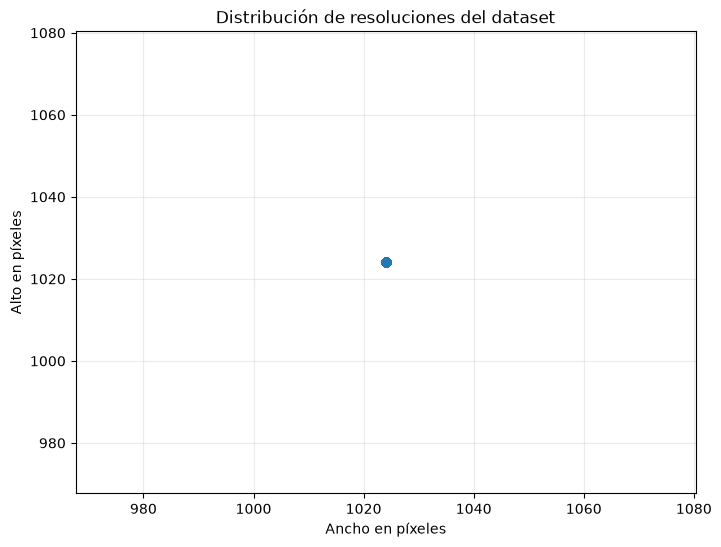

,Gráfica,Archivo,Interpretación
0,Distribución de resoluciones,C:\Users\Julian\Documents\UNI\semestre_10\big_...,La dispersión permite identificar homogeneidad...


In [10]:
# ============================================================
# CELDA 7: Gráfica de distribución de resoluciones
# Explicación:
# Genera, guarda y muestra una gráfica de dispersión con ancho y alto de las imágenes del dataset.
# ============================================================

fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(dataset_df["width"], dataset_df["height"], alpha=0.7)
ax.set_title("Distribución de resoluciones del dataset")
ax.set_xlabel("Ancho en píxeles")
ax.set_ylabel("Alto en píxeles")
ax.grid(True, alpha=0.25)

resolution_plot = FIGURES_DIR / "01_distribucion_resoluciones.png"
fig.savefig(resolution_plot, dpi=160, bbox_inches="tight")
plt.show()

resolution_analysis = pd.DataFrame({
    "Gráfica": ["Distribución de resoluciones"],
    "Archivo": [str(resolution_plot)],
    "Interpretación": [
        "La dispersión permite identificar homogeneidad o variabilidad en las dimensiones de entrada. "
        "Una alta variabilidad puede justificar redimensionamiento o normalización antes de la inferencia."
    ]
})
display(resolution_analysis)


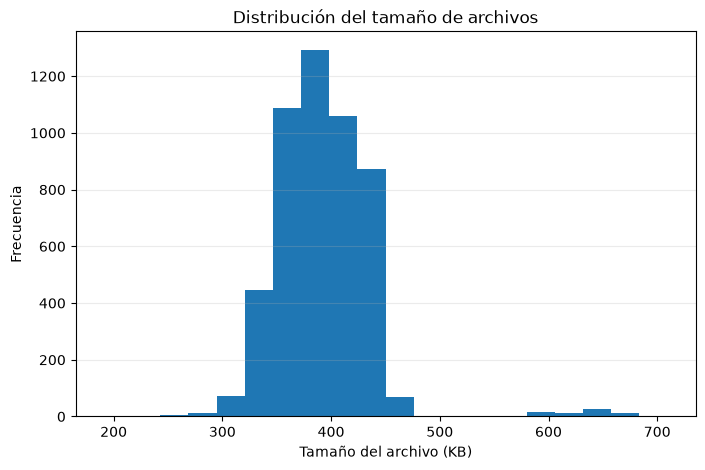

,Gráfica,Archivo,Interpretación
0,Distribución del tamaño de archivos,C:\Users\Julian\Documents\UNI\semestre_10\big_...,La distribución facilita la detección de archi...


In [11]:
# ============================================================
# CELDA 8: Gráfica del tamaño de archivos
# Explicación:
# Genera un histograma del tamaño en kilobytes, guarda la figura y presenta una tabla de interpretación.
# ============================================================

fig, ax = plt.subplots(figsize=(8, 5))
ax.hist(dataset_df["file_size_kb"], bins=min(20, max(5, len(dataset_df))))
ax.set_title("Distribución del tamaño de archivos")
ax.set_xlabel("Tamaño del archivo (KB)")
ax.set_ylabel("Frecuencia")
ax.grid(True, axis="y", alpha=0.25)

size_plot = FIGURES_DIR / "02_distribucion_tamano_archivos.png"
fig.savefig(size_plot, dpi=160, bbox_inches="tight")
plt.show()

size_analysis = pd.DataFrame({
    "Gráfica": ["Distribución del tamaño de archivos"],
    "Archivo": [str(size_plot)],
    "Interpretación": [
        "La distribución facilita la detección de archivos atípicos por compresión, resolución o contenido. "
        "Valores extremos requieren revisión antes de atribuir diferencias al modelo."
    ]
})
display(size_analysis)


In [12]:
# ============================================================
# CELDA 9: Selección de muestras para evaluación
# Explicación:
# Selecciona un subconjunto reproducible del dataset para limitar el consumo de memoria y tiempo en una GTX 1650 Ti.
# ============================================================

sample_count = min(MAX_EVAL_SAMPLES, len(dataset_df))

sample_df = dataset_df.sample(
    n=sample_count,
    random_state=SEED
).reset_index(drop=True)

display(sample_df[["filename", "width", "height", "file_size_kb"]])


,filename,width,height,file_size_kb
0,00000013_046.png,1024,1024,438.83
1,00000632_013.png,1024,1024,440.81
2,00000744_006.png,1024,1024,437.79
3,00001333_001.png,1024,1024,413.72
4,00001315_006.png,1024,1024,347.02
5,00001257_000.png,1024,1024,430.98
6,00000032_043.png,1024,1024,337.57
7,00000181_008.png,1024,1024,345.14
8,00001252_000.png,1024,1024,338.20
9,00000289_007.png,1024,1024,434.75


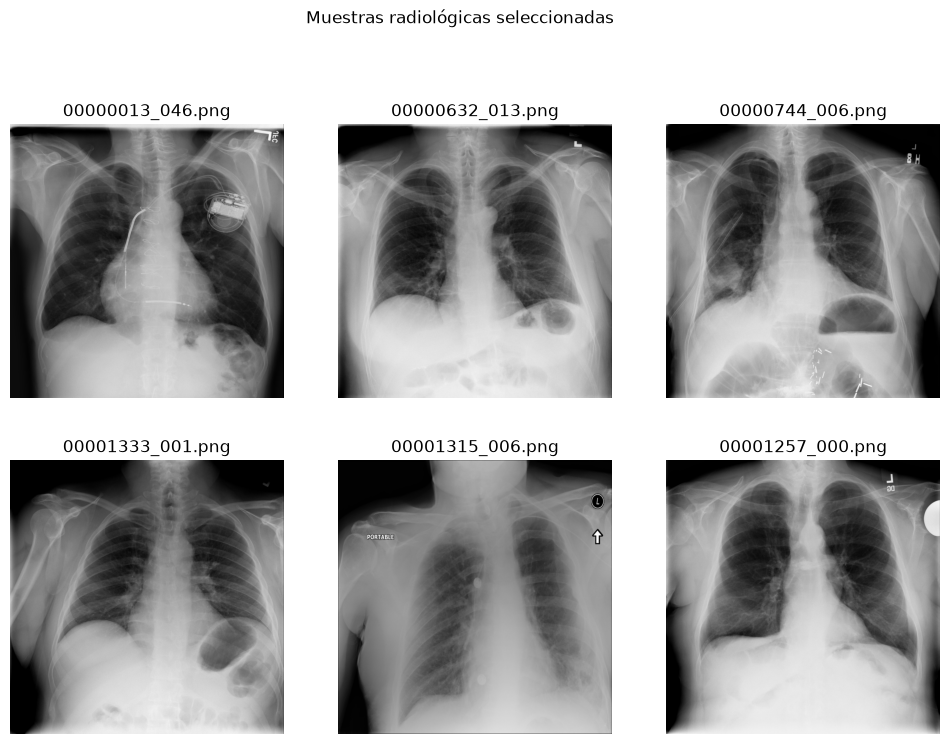

,Gráfica,Archivo,Interpretación
0,Muestras del dataset,C:\Users\Julian\Documents\UNI\semestre_10\big_...,La inspección visual permite verificar heterog...


In [13]:
# ============================================================
# CELDA 10: Visualización de muestras del dataset
# Explicación:
# Muestra una cuadrícula de imágenes seleccionadas y guarda la composición en el directorio de figuras.
# ============================================================

n_show = min(6, len(sample_df))
cols = 3
rows = int(np.ceil(n_show / cols))

fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
axes = np.array(axes).reshape(-1)

for idx in range(len(axes)):
    ax = axes[idx]
    if idx < n_show:
        path = Path(sample_df.loc[idx, "path"])
        with Image.open(path) as img:
            ax.imshow(img.convert("RGB"))
        ax.set_title(sample_df.loc[idx, "filename"])
        ax.axis("off")
    else:
        ax.axis("off")

fig.suptitle("Muestras radiológicas seleccionadas", y=1.02)
sample_plot = FIGURES_DIR / "03_muestras_dataset.png"
fig.savefig(sample_plot, dpi=160, bbox_inches="tight")
plt.show()

sample_analysis = pd.DataFrame({
    "Gráfica": ["Muestras del dataset"],
    "Archivo": [str(sample_plot)],
    "Interpretación": [
        "La inspección visual permite verificar heterogeneidad, orientación, contraste y presencia de artefactos. "
        "La evaluación clínica no se deriva de esta inspección descriptiva."
    ]
})
display(sample_analysis)


In [14]:
# ============================================================
# CELDA 11: Métricas visuales básicas por imagen
# Explicación:
# Calcula brillo medio, contraste aproximado y relación de aspecto como indicadores descriptivos de calidad de entrada.
# ============================================================

quality_rows = []

for _, row in sample_df.iterrows():
    path = Path(row["path"])
    with Image.open(path) as img:
        gray = img.convert("L")
        stat = ImageStat.Stat(gray)
        mean_brightness = float(stat.mean[0])
        contrast_std = float(stat.stddev[0])
        aspect_ratio = img.width / img.height if img.height else np.nan

    quality_rows.append({
        "filename": row["filename"],
        "mean_brightness": round(mean_brightness, 3),
        "contrast_std": round(contrast_std, 3),
        "aspect_ratio": round(aspect_ratio, 4)
    })

quality_df = pd.DataFrame(quality_rows)
display(quality_df)


,filename,mean_brightness,contrast_std,aspect_ratio
0,00000013_046.png,109.951,61.521,1.0
1,00000632_013.png,138.628,66.385,1.0
2,00000744_006.png,124.085,65.053,1.0
3,00001333_001.png,116.303,67.928,1.0
4,00001315_006.png,119.635,54.042,1.0
5,00001257_000.png,136.908,71.069,1.0
6,00000032_043.png,112.236,60.416,1.0
7,00000181_008.png,122.301,46.329,1.0
8,00001252_000.png,148.189,64.927,1.0
9,00000289_007.png,132.974,69.656,1.0


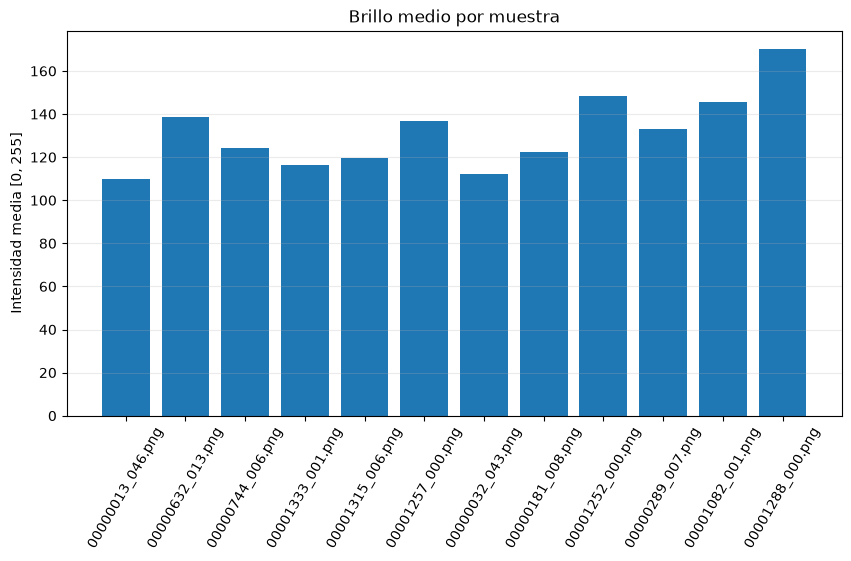

,Gráfica,Archivo,Interpretación
0,Brillo medio por muestra,C:\Users\Julian\Documents\UNI\semestre_10\big_...,Diferencias amplias en intensidad media pueden...


In [15]:
# ============================================================
# CELDA 12: Gráfica de brillo por muestra
# Explicación:
# Compara el brillo medio de las imágenes seleccionadas, guarda la figura y presenta una interpretación tabular.
# ============================================================

fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(quality_df["filename"], quality_df["mean_brightness"])
ax.set_title("Brillo medio por muestra")
ax.set_ylabel("Intensidad media [0, 255]")
ax.tick_params(axis="x", rotation=60)
ax.grid(True, axis="y", alpha=0.25)

brightness_plot = FIGURES_DIR / "04_brillo_medio_muestras.png"
fig.savefig(brightness_plot, dpi=160, bbox_inches="tight")
plt.show()

brightness_analysis = pd.DataFrame({
    "Gráfica": ["Brillo medio por muestra"],
    "Archivo": [str(brightness_plot)],
    "Interpretación": [
        "Diferencias amplias en intensidad media pueden reflejar variaciones de exposición, posprocesamiento o formato. "
        "Estas diferencias pueden influir en la estabilidad de la interpretación multimodal."
    ]
})
display(brightness_analysis)


In [16]:
# ============================================================
# CELDA 13: Configuración de cuantización para GTX 1650 Ti
# Explicación:
# Define cuantización de 4 bits para reducir consumo de VRAM durante la carga de MedGemma.
# ============================================================

compute_dtype = torch.float16 if torch.cuda.is_available() else torch.float32

quantization_config = None
if torch.cuda.is_available():
    quantization_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_quant_type="nf4",
        bnb_4bit_use_double_quant=True,
        bnb_4bit_compute_dtype=compute_dtype
    )

print("Cuantización 4-bit configurada:", quantization_config is not None)


Cuantización 4-bit configurada: False


In [17]:
# ============================================================
# CELDA 14: Configuración de Gemini para análisis de imágenes
# Explicación:
# Configura el cliente de Gemini mediante la clave almacenada
# en el archivo .env.
#
# El procesamiento se realiza mediante API, por lo que no se
# requiere cargar MedGemma, Hugging Face, CUDA, bitsandbytes
# ni utilizar memoria GPU para ejecutar el modelo.
#
# Gemini recibirá las imágenes radiográficas y realizará:
#
# 1. Evaluación de calidad técnica.
# 2. Identificación de posibles problemas de contraste.
# 3. Evaluación de brillo y exposición.
# 4. Identificación de artefactos.
# 5. Análisis visual multimodal.
#
# Las modificaciones físicas de píxeles se realizan localmente
# mediante procesamiento digital de imágenes, conservando
# siempre la imagen radiológica original.
# ============================================================

import os
import time

from dotenv import load_dotenv
from google import genai


# ============================================================
# 1. CARGA DE VARIABLES DE ENTORNO
# ============================================================

load_dotenv(PROJECT_DIR / ".env")


# ============================================================
# 2. CARGA DE LA CLAVE API
# ============================================================

GEMINI_API_KEY = os.getenv(
    "GEMINI_API_KEY"
)


# ============================================================
# 3. VALIDACIÓN DE CREDENCIALES
# ============================================================

if not GEMINI_API_KEY:

    raise EnvironmentError(
        "GEMINI_API_KEY no se encuentra configurada "
        "en el archivo .env."
    )


# ============================================================
# 4. CONFIGURACIÓN DEL MODELO GEMINI
# ============================================================

GEMINI_MODEL = "gemini-3.6-flash"


# ============================================================
# 5. CREACIÓN DEL CLIENTE
# ============================================================

load_start = time.perf_counter()


client = genai.Client(
    api_key=GEMINI_API_KEY
)


client_load_seconds = (
    time.perf_counter()
    - load_start
)


# ============================================================
# 6. INFORMACIÓN DEL MOTOR DE INFERENCIA
# ============================================================

print("=" * 75)

print("CONFIGURACIÓN DEL MODELO GEMINI")

print("=" * 75)

print(
    "Modelo:",
    GEMINI_MODEL
)

print(
    "Método de ejecución:",
    "API de Gemini"
)

print(
    "Procesamiento:",
    "Remoto"
)

print(
    "GPU local requerida:",
    "No"
)

print(
    "HF_TOKEN requerido:",
    "No"
)

print(
    "MedGemma local requerido:",
    "No"
)

print(
    "Tiempo de configuración:",
    round(
        client_load_seconds,
        4
    ),
    "segundos"
)

print("=" * 75)

CONFIGURACIÓN DEL MODELO GEMINI
Modelo: gemini-3.6-flash
Método de ejecución: API de Gemini
Procesamiento: Remoto
GPU local requerida: No
HF_TOKEN requerido: No
MedGemma local requerido: No
Tiempo de configuración: 0.0105 segundos


In [18]:
# ============================================================
# CELDA 15: Persistencia local de la configuración de Gemini
# Explicación:
# Al utilizar Gemini mediante API, los pesos del modelo y el
# procesador no se almacenan localmente.
#
# Esta celda almacena únicamente la configuración necesaria
# para garantizar reproducibilidad del experimento:
#
# - Modelo Gemini utilizado.
# - Método de inferencia.
# - Ruta del dataset.
# - Ruta de resultados.
# - Parámetros de generación.
# - Fecha de creación de la configuración.
#
# La clave GEMINI_API_KEY no se almacena en este archivo por
# razones de seguridad.
# ============================================================


# ============================================================
# 1. IMPORTACIÓN DE LIBRERÍAS
# ============================================================

import json
from pathlib import Path
from datetime import datetime


# ============================================================
# 2. DIRECTORIO DE CONFIGURACIÓN
# ============================================================

CONFIG_DIR = (
    PROJECT_DIR
    / "configuracion"
)

CONFIG_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# 3. ARCHIVO DE CONFIGURACIÓN
# ============================================================

CONFIG_FILE = (
    CONFIG_DIR
    / "gemini_config.json"
)


# ============================================================
# 4. CONFIGURACIÓN DEL EXPERIMENTO
# ============================================================

gemini_config = {

    "modelo": GEMINI_MODEL,

    "proveedor": "Google Gemini",

    "tipo_ejecucion": "API",

    "procesamiento": "Remoto",

    "gpu_local_requerida": False,

    "modelo_local_requerido": False,

    "huggingface_requerido": False,

    "hf_token_requerido": False,

    "gemini_api_key_requerida": True,

    "dataset": str(
        DATASET_DIR
    ),

    "directorio_salida": str(
        OUTPUT_DIR
    ),

    "directorio_figuras": str(
        FIGURES_DIR
    ),

    "fecha_configuracion": (
        datetime.now().isoformat(
            timespec="seconds"
        )
    ),

    "parametros_generacion": {

        "max_output_tokens": 65536,

        "top_p": 0.95,

        "thinking_level": "medium"

    },

    "procesamiento_imagen": {

        "escala_grises": True,

        "normalizacion": True,

        "clahe": True,

        "reduccion_ruido": True,

        "preservar_original": True

    }

}


# ============================================================
# 5. ALMACENAMIENTO DE LA CONFIGURACIÓN
# ============================================================

try:

    with open(
        CONFIG_FILE,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            gemini_config,
            file,
            indent=4,
            ensure_ascii=False
        )

    save_status = (
        "Configuración de Gemini almacenada correctamente."
    )


except Exception as exc:

    save_status = (
        "No fue posible almacenar la configuración. "
        f"Error: {exc}"
    )


# ============================================================
# 6. VERIFICACIÓN DE LA API KEY
# ============================================================

api_key_status = bool(
    GEMINI_API_KEY
)


# ============================================================
# 7. PRESENTACIÓN DE RESULTADOS
# ============================================================

print("=" * 75)

print(
    "PERSISTENCIA DE LA CONFIGURACIÓN"
)

print("=" * 75)

print()

print(
    save_status
)

print()

print(
    "Modelo:",
    GEMINI_MODEL
)

print(
    "Motor de inferencia:",
    "Gemini API"
)

print(
    "Procesamiento:",
    "Remoto"
)

print(
    "API Key configurada:",
    api_key_status
)

print(
    "Modelo almacenado localmente:",
    False
)

print(
    "GPU local requerida:",
    False
)

print()

print(
    "Archivo de configuración:"
)

print(
    CONFIG_FILE
)

print()

print("=" * 75)


# ============================================================
# 8. PRESENTACIÓN DE LA CONFIGURACIÓN
# ============================================================

print(
    json.dumps(
        gemini_config,
        indent=4,
        ensure_ascii=False
    )
)

PERSISTENCIA DE LA CONFIGURACIÓN

Configuración de Gemini almacenada correctamente.

Modelo: gemini-3.6-flash
Motor de inferencia: Gemini API
Procesamiento: Remoto
API Key configurada: True
Modelo almacenado localmente: False
GPU local requerida: False

Archivo de configuración:
C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1\configuracion\gemini_config.json

{
    "modelo": "gemini-3.6-flash",
    "proveedor": "Google Gemini",
    "tipo_ejecucion": "API",
    "procesamiento": "Remoto",
    "gpu_local_requerida": false,
    "modelo_local_requerido": false,
    "huggingface_requerido": false,
    "hf_token_requerido": false,
    "gemini_api_key_requerida": true,
    "dataset": "C:\\Users\\Julian\\Documents\\UNI\\semestre_10\\big_data\\LAb_radiologia\\radiologia 1\\data\\archive",
    "directorio_salida": "C:\\Users\\Julian\\Documents\\UNI\\semestre_10\\big_data\\LAb_radiologia\\radiologia 1\\outputs",
    "directorio_figuras": "C:\\Users\\Julian\\Documents

In [19]:
# ============================================================
# CELDA 16: Definición del prompt radiológico para Gemini
# Explicación:
# Define las instrucciones utilizadas por Gemini para realizar
# el análisis estructurado de cada imagen radiográfica.
#
# La salida incluye:
#
# - Evaluación de calidad técnica.
# - Tipo y región anatómica.
# - Hallazgos visuales.
# - Localización de los hallazgos.
# - Impresión radiológica preliminar.
# - Clasificación general.
# - Nivel de confianza.
# - Limitaciones.
# - Recomendación.
#
# La estructura uniforme facilita el almacenamiento posterior
# de resultados en DataFrame y CSV, así como el cálculo de
# métricas cuando existan etiquetas reales.
# ============================================================


PROMPT_RADIOLOGIA = """
Analizar cuidadosamente la imagen radiológica proporcionada.

El análisis corresponde a un procedimiento experimental de
inteligencia artificial aplicado al procesamiento y análisis
de imágenes médicas.

Realizar una evaluación objetiva basada exclusivamente en la
información visual disponible en la imagen.

No asumir información clínica, antecedentes, síntomas, edad,
sexo ni resultados de otros estudios que no estén disponibles.

Generar la respuesta completamente en español y respetar
EXACTAMENTE la siguiente estructura:


============================================================
TIPO_ESTUDIO:
============================================================

Identificar, cuando sea posible, el tipo de estudio observado.

Ejemplos:

- Radiografía de tórax.
- Radiografía abdominal.
- Radiografía musculoesquelética.
- Otro.
- No determinado.


============================================================
REGION_ANATOMICA:
============================================================

Indicar la región anatómica principal visible en la imagen.

No inferir regiones que no sean claramente observables.


============================================================
CALIDAD_TECNICA:
============================================================

Evaluar brevemente la calidad técnica de la imagen considerando,
cuando sea posible:

- Resolución.
- Nitidez.
- Contraste.
- Brillo.
- Exposición.
- Posicionamiento.
- Rotación.
- Inspiración, cuando corresponda.
- Presencia de ruido.
- Presencia de artefactos.
- Visibilidad de las estructuras anatómicas.

Clasificar la calidad general como una de las siguientes:

ADECUADA
LIMITADA
NO_EVALUABLE


============================================================
HALLAZGOS:
============================================================

Describir objetivamente únicamente los hallazgos visibles.

Examinar sistemáticamente las estructuras anatómicas presentes.

Para una radiografía de tórax considerar, cuando sean visibles:

- Campos pulmonares.
- Hilios pulmonares.
- Pleuras.
- Senos costofrénicos.
- Diafragma.
- Silueta cardiomediastínica.
- Mediastino.
- Tráquea.
- Estructuras óseas.
- Tejidos blandos.
- Dispositivos médicos o elementos externos.

Para cada posible hallazgo describir, cuando sea posible:

- Tipo.
- Localización.
- Lateralidad.
- Distribución.
- Extensión.
- Características visuales.

No inventar hallazgos cuando la imagen no permita identificarlos.


============================================================
HALLAZGO_PRINCIPAL:
============================================================

Indicar el hallazgo visual considerado más relevante.

Cuando no exista un hallazgo evidente escribir:

Sin hallazgo radiográfico evidente.

Cuando la imagen no permita determinarlo escribir:

Indeterminado.


============================================================
LOCALIZACION:
============================================================

Indicar la localización anatómica del hallazgo principal.

Utilizar:

No aplica

cuando no exista un hallazgo evidente.

Utilizar:

Indeterminada

cuando la localización no pueda establecerse.


============================================================
IMPRESION:
============================================================

Generar una síntesis breve de los principales hallazgos
radiográficos observados.

La impresión debe derivarse exclusivamente de la imagen.

Evitar afirmaciones diagnósticas absolutas.


============================================================
CATEGORIA:
============================================================

Seleccionar EXACTAMENTE UNA de las siguientes categorías:

normal
abnormal
indeterminate

Criterios:

normal:
No se identifican alteraciones radiográficas evidentes en las
estructuras evaluables.

abnormal:
Existe al menos un hallazgo visual potencialmente anormal.

indeterminate:
La calidad, ambigüedad o información disponible no permite una
clasificación suficientemente fundamentada.

Escribir solamente una de las tres categorías indicadas.


============================================================
CONFIANZA:
============================================================

Asignar un valor entero entre 0 y 100 que represente el nivel
de confianza del análisis visual realizado.

Interpretación:

0-39   = confianza baja
40-69  = confianza moderada
70-89  = confianza alta
90-100 = confianza muy alta

El valor representa confianza del modelo y no probabilidad
clínica de enfermedad.


============================================================
JUSTIFICACION_CATEGORIA:
============================================================

Explicar brevemente qué evidencia visual condujo a seleccionar
la categoría anterior.


============================================================
LIMITACIONES:
============================================================

Describir las principales limitaciones del análisis.

Considerar:

- Calidad de imagen.
- Resolución.
- Proyección desconocida.
- Ausencia de información clínica.
- Superposición anatómica.
- Artefactos.
- Incertidumbre visual.
- Limitaciones propias del análisis automatizado.


============================================================
RECOMENDACION:
============================================================

Indicar que los resultados corresponden a un análisis
automatizado experimental.

Cuando existan hallazgos potencialmente relevantes, indicar la
necesidad de correlación con información clínica y valoración
por un profesional cualificado.

No presentar el resultado como sustituto de una interpretación
radiológica profesional.


============================================================
REGLAS GENERALES:
============================================================

1. Analizar exclusivamente la imagen proporcionada.

2. No inventar información clínica.

3. No afirmar patologías que no puedan sustentarse visualmente.

4. Diferenciar hallazgos observables de interpretaciones
   potenciales.

5. Expresar incertidumbre cuando corresponda.

6. Evitar afirmaciones absolutas.

7. Mantener terminología radiológica clara y consistente.

8. No utilizar información externa para modificar los hallazgos
   observados en la imagen.

9. Mantener exactamente los nombres de las secciones solicitadas.

10. En CATEGORIA escribir únicamente:
    normal, abnormal o indeterminate.

11. En CONFIANZA escribir únicamente un número entero entre
    0 y 100.

12. No omitir ninguna sección.
""".strip()


# ============================================================
# VERIFICACIÓN DEL PROMPT
# ============================================================

print("=" * 80)
print("PROMPT RADIOLÓGICO CONFIGURADO")
print("=" * 80)

print()

print(PROMPT_RADIOLOGIA)

print()

print("=" * 80)

print(
    "Cantidad de caracteres:",
    len(PROMPT_RADIOLOGIA)
)

print(
    "Cantidad aproximada de palabras:",
    len(PROMPT_RADIOLOGIA.split())
)

print("=" * 80)

PROMPT RADIOLÓGICO CONFIGURADO

Analizar cuidadosamente la imagen radiológica proporcionada.

El análisis corresponde a un procedimiento experimental de
inteligencia artificial aplicado al procesamiento y análisis
de imágenes médicas.

Realizar una evaluación objetiva basada exclusivamente en la
información visual disponible en la imagen.

No asumir información clínica, antecedentes, síntomas, edad,
sexo ni resultados de otros estudios que no estén disponibles.

Generar la respuesta completamente en español y respetar
EXACTAMENTE la siguiente estructura:


TIPO_ESTUDIO:

Identificar, cuando sea posible, el tipo de estudio observado.

Ejemplos:

- Radiografía de tórax.
- Radiografía abdominal.
- Radiografía musculoesquelética.
- Otro.
- No determinado.


REGION_ANATOMICA:

Indicar la región anatómica principal visible en la imagen.

No inferir regiones que no sean claramente observables.


CALIDAD_TECNICA:

Evaluar brevemente la calidad técnica de la imagen considerando,
cuando sea posi

In [20]:
# ============================================================
# CELDA 17: Funciones de inferencia y extracción con Gemini API
# Explicación:
# Define funciones reutilizables para:
#
# - Enviar una imagen radiológica a Gemini.
# - Ejecutar el prompt estructurado definido previamente.
# - Medir la latencia de la consulta.
# - Extraer automáticamente la categoría.
# - Extraer el nivel de confianza.
# - Extraer campos estructurados del reporte.
#
# El procesamiento del modelo se realiza de forma remota mediante
# Gemini API, por lo que no se utilizan GPU, CUDA, PyTorch,
# processor ni pesos locales del modelo.
# ============================================================

import re
import time
from pathlib import Path

from PIL import Image


# ============================================================
# 1. FUNCIÓN PARA EXTRAER LA CATEGORÍA
# ============================================================

def extract_category(text):
    """
    Extrae la categoría radiológica generada por Gemini.

    Categorías permitidas:

    normal
    abnormal
    indeterminate
    """

    match = re.search(
        r"CATEGORIA\s*:\s*(normal|abnormal|indeterminate)",
        text,
        flags=re.IGNORECASE
    )

    if match:

        return match.group(1).lower()


    # --------------------------------------------------------
    # Método de respaldo
    # --------------------------------------------------------

    lowered = text.lower()


    if "indeterminate" in lowered:

        return "indeterminate"


    if "abnormal" in lowered:

        return "abnormal"


    if "normal" in lowered:

        return "normal"


    return "indeterminate"


# ============================================================
# 2. FUNCIÓN PARA EXTRAER CONFIANZA
# ============================================================

def extract_confidence(text):
    """
    Extrae el valor numérico de confianza generado por Gemini.

    El rango esperado es de 0 a 100.
    """

    match = re.search(
        r"CONFIANZA\s*:\s*(\d{1,3})",
        text,
        flags=re.IGNORECASE
    )


    if match:

        confidence = int(
            match.group(1)
        )


        # ----------------------------------------------------
        # Control del rango permitido
        # ----------------------------------------------------

        confidence = max(
            0,
            min(
                confidence,
                100
            )
        )


        return confidence


    return None


# ============================================================
# 3. FUNCIÓN GENERAL PARA EXTRAER UNA SECCIÓN
# ============================================================

def extract_section(
    text,
    section_name
):
    """
    Extrae el contenido correspondiente a una sección del
    reporte estructurado generado por Gemini.
    """

    pattern = (

        rf"{re.escape(section_name)}\s*:\s*"

        rf"(.*?)"

        rf"(?=\n[A-ZÁÉÍÓÚÑ_]+\s*:|\Z)"
    )


    match = re.search(

        pattern,

        text,

        flags=(
            re.IGNORECASE
            | re.DOTALL
        )

    )


    if match:

        return (
            match.group(1)
            .strip()
        )


    return ""


# ============================================================
# 4. FUNCIÓN DE INFERENCIA RADIOLÓGICA CON GEMINI
# ============================================================

def infer_radiology(
    image_path
):
    """
    Envía una imagen radiológica a Gemini API y retorna un
    conjunto estructurado de resultados.
    """

    # --------------------------------------------------------
    # Conversión de la ruta
    # --------------------------------------------------------

    image_path = Path(
        image_path
    )


    # --------------------------------------------------------
    # Validación del archivo
    # --------------------------------------------------------

    if not image_path.exists():

        raise FileNotFoundError(

            f"No se encontró la imagen:\n{image_path}"

        )


    # ========================================================
    # 5. CARGA DE LA IMAGEN
    # ========================================================

    with Image.open(
        image_path
    ) as img:

        image = img.convert(
            "RGB"
        )


    # ========================================================
    # 6. INICIO DE MEDICIÓN DE TIEMPO
    # ========================================================

    start = time.perf_counter()


    # ========================================================
    # 7. CONSULTA A GEMINI
    # ========================================================

    try:

        response = client.models.generate_content(

            model=GEMINI_MODEL,

            contents=[

                PROMPT_RADIOLOGIA,

                image

            ]

        )


        # ----------------------------------------------------
        # Texto generado
        # ----------------------------------------------------

        generated_text = (

            response.text.strip()

            if response.text

            else ""

        )


    except Exception as exc:

        latency = (
            time.perf_counter()
            - start
        )


        return {

            "filename":
                image_path.name,

            "path":
                str(image_path),

            "status":
                "error",

            "error":
                str(exc),

            "report":
                "",

            "category":
                "indeterminate",

            "confidence":
                None,

            "latency_seconds":
                round(
                    latency,
                    3
                ),

            "word_count":
                0,

            "char_count":
                0

        }


    # ========================================================
    # 8. FINALIZACIÓN DEL TIEMPO DE INFERENCIA
    # ========================================================

    latency = (

        time.perf_counter()

        - start

    )


    # ========================================================
    # 9. EXTRACCIÓN DE CAMPOS
    # ========================================================

    category = extract_category(
        generated_text
    )


    confidence = extract_confidence(
        generated_text
    )


    tipo_estudio = extract_section(
        generated_text,
        "TIPO_ESTUDIO"
    )


    region_anatomica = extract_section(
        generated_text,
        "REGION_ANATOMICA"
    )


    calidad_tecnica = extract_section(
        generated_text,
        "CALIDAD_TECNICA"
    )


    hallazgos = extract_section(
        generated_text,
        "HALLAZGOS"
    )


    hallazgo_principal = extract_section(
        generated_text,
        "HALLAZGO_PRINCIPAL"
    )


    localizacion = extract_section(
        generated_text,
        "LOCALIZACION"
    )


    impresion = extract_section(
        generated_text,
        "IMPRESION"
    )


    justificacion = extract_section(
        generated_text,
        "JUSTIFICACION_CATEGORIA"
    )


    limitaciones = extract_section(
        generated_text,
        "LIMITACIONES"
    )


    recomendacion = extract_section(
        generated_text,
        "RECOMENDACION"
    )


    # ========================================================
    # 10. RESULTADO ESTRUCTURADO
    # ========================================================

    result = {

        "filename":
            image_path.name,

        "path":
            str(image_path),

        "status":
            "success",

        "error":
            "",

        "report":
            generated_text,

        "tipo_estudio":
            tipo_estudio,

        "region_anatomica":
            region_anatomica,

        "calidad_tecnica":
            calidad_tecnica,

        "hallazgos":
            hallazgos,

        "hallazgo_principal":
            hallazgo_principal,

        "localizacion":
            localizacion,

        "impresion":
            impresion,

        "category":
            category,

        "confidence":
            confidence,

        "justificacion_categoria":
            justificacion,

        "limitaciones":
            limitaciones,

        "recomendacion":
            recomendacion,

        "latency_seconds":
            round(
                latency,
                3
            ),

        "word_count":
            len(
                generated_text.split()
            ),

        "char_count":
            len(
                generated_text
            )

    }


    return result

In [21]:
# ============================================================
# CELDA 18: Inferencia sobre 10 imágenes del dataset con Gemini API
# Explicación:
# Selecciona exactamente 10 imágenes del dataset y ejecuta
# Gemini sobre cada una.
#
# Para cada radiografía se registran:
#
# - Categoría predicha.
# - Nivel de confianza.
# - Tipo de estudio.
# - Región anatómica.
# - Calidad técnica.
# - Hallazgo principal.
# - Localización.
# - Impresión.
# - Latencia de inferencia.
# - Longitud del reporte.
# - Estado del procesamiento.
#
# La selección utiliza una semilla fija para garantizar que
# las mismas 10 imágenes puedan reproducirse posteriormente.
#
# La inferencia se realiza de forma remota mediante Gemini API,
# por lo que no se requiere CUDA ni memoria VRAM local.
# ============================================================

import numpy as np
import pandas as pd

from tqdm.notebook import tqdm
from IPython.display import display


# ============================================================
# 1. CONFIGURACIÓN DEL NÚMERO DE IMÁGENES
# ============================================================

NUMERO_IMAGENES_ANALISIS = 10

RANDOM_STATE = 42


# ============================================================
# 2. VALIDACIÓN DEL DATASET
# ============================================================

if "dataset_df" not in globals():

    raise NameError(
        "dataset_df no se encuentra definido. "
        "Debe ejecutarse previamente la celda de carga del dataset."
    )


if dataset_df.empty:

    raise ValueError(
        "dataset_df se encuentra vacío."
    )


if "path" not in dataset_df.columns:

    raise KeyError(
        "La columna 'path' no existe en dataset_df."
    )


if "filename" not in dataset_df.columns:

    raise KeyError(
        "La columna 'filename' no existe en dataset_df."
    )


# ============================================================
# 3. DETERMINACIÓN DEL NÚMERO REAL DE MUESTRAS
# ============================================================

numero_muestras = min(
    NUMERO_IMAGENES_ANALISIS,
    len(dataset_df)
)


# ============================================================
# 4. SELECCIÓN ALEATORIA DE 10 RADIOGRAFÍAS
# ============================================================

sample_df = (
    dataset_df
    .sample(
        n=numero_muestras,
        random_state=RANDOM_STATE
    )
    .reset_index(drop=True)
)


print("=" * 80)
print("SELECCIÓN DE IMÁGENES PARA GEMINI")
print("=" * 80)

print(
    "Total de imágenes disponibles:",
    len(dataset_df)
)

print(
    "Imágenes seleccionadas:",
    len(sample_df)
)

print(
    "Semilla de selección:",
    RANDOM_STATE
)

print("=" * 80)


# ============================================================
# 5. VISUALIZACIÓN DE LAS 10 IMÁGENES SELECCIONADAS
# ============================================================

columnas_muestra = [
    column
    for column in [
        "filename",
        "folder",
        "resolution",
        "path"
    ]
    if column in sample_df.columns
]


display(
    sample_df[
        columnas_muestra
    ]
)


# ============================================================
# 6. ESTRUCTURA PARA ALMACENAR RESULTADOS
# ============================================================

evaluation_rows = []


# ============================================================
# 7. PROCESAMIENTO DE LAS 10 IMÁGENES
# ============================================================

for position, row in tqdm(
    sample_df.iterrows(),
    total=len(sample_df),
    desc="Analizando radiografías con Gemini",
    unit="imagen",
    dynamic_ncols=True
):

    try:

        # ----------------------------------------------------
        # Información de seguimiento
        # ----------------------------------------------------

        print(
            f"\nProcesando imagen "
            f"{position + 1}/{len(sample_df)}: "
            f"{row['filename']}"
        )


        # ----------------------------------------------------
        # Inferencia mediante Gemini API
        # ----------------------------------------------------

        result = infer_radiology(
            row["path"]
        )


        # ----------------------------------------------------
        # Registro del resultado
        # ----------------------------------------------------

        evaluation_rows.append({

            "sample_number":
                position + 1,

            "filename":
                row["filename"],

            "path":
                row["path"],

            "status":
                result.get(
                    "status",
                    "success"
                ),

            "category_pred":
                result.get(
                    "category",
                    "indeterminate"
                ),

            "confidence":
                result.get(
                    "confidence",
                    np.nan
                ),

            "tipo_estudio":
                result.get(
                    "tipo_estudio",
                    ""
                ),

            "region_anatomica":
                result.get(
                    "region_anatomica",
                    ""
                ),

            "calidad_tecnica":
                result.get(
                    "calidad_tecnica",
                    ""
                ),

            "hallazgo_principal":
                result.get(
                    "hallazgo_principal",
                    ""
                ),

            "localizacion":
                result.get(
                    "localizacion",
                    ""
                ),

            "impresion":
                result.get(
                    "impresion",
                    ""
                ),

            "justificacion_categoria":
                result.get(
                    "justificacion_categoria",
                    ""
                ),

            "limitaciones":
                result.get(
                    "limitaciones",
                    ""
                ),

            "recomendacion":
                result.get(
                    "recomendacion",
                    ""
                ),

            "latency_seconds":
                round(
                    result.get(
                        "latency_seconds",
                        np.nan
                    ),
                    3
                ),

            "word_count":
                result.get(
                    "word_count",
                    np.nan
                ),

            "char_count":
                result.get(
                    "char_count",
                    np.nan
                ),

            "report":
                result.get(
                    "report",
                    ""
                ),

            "error":
                result.get(
                    "error",
                    ""
                )

        })


    except Exception as exc:

        # ----------------------------------------------------
        # Registro controlado de errores
        # ----------------------------------------------------

        evaluation_rows.append({

            "sample_number":
                position + 1,

            "filename":
                row["filename"],

            "path":
                row["path"],

            "status":
                "error",

            "category_pred":
                "error",

            "confidence":
                np.nan,

            "tipo_estudio":
                "",

            "region_anatomica":
                "",

            "calidad_tecnica":
                "",

            "hallazgo_principal":
                "",

            "localizacion":
                "",

            "impresion":
                "",

            "justificacion_categoria":
                "",

            "limitaciones":
                "",

            "recomendacion":
                "",

            "latency_seconds":
                np.nan,

            "word_count":
                np.nan,

            "char_count":
                np.nan,

            "report":
                "",

            "error":
                str(exc)

        })


# ============================================================
# 8. CREACIÓN DEL DATAFRAME DE RESULTADOS
# ============================================================

evaluation_df = pd.DataFrame(
    evaluation_rows
)


# ============================================================
# 9. RESUMEN DE PROCESAMIENTO
# ============================================================

total_samples = len(
    evaluation_df
)


successful_samples = (
    evaluation_df[
        "status"
    ]
    .eq("success")
    .sum()
)


error_samples = (
    evaluation_df[
        "status"
    ]
    .eq("error")
    .sum()
)


print()

print("=" * 80)

print(
    "INFERENCIA MEDIANTE GEMINI FINALIZADA"
)

print("=" * 80)

print(
    "Modelo:",
    GEMINI_MODEL
)

print(
    "Imágenes programadas:",
    numero_muestras
)

print(
    "Imágenes procesadas:",
    total_samples
)

print(
    "Procesamientos exitosos:",
    successful_samples
)

print(
    "Procesamientos con error:",
    error_samples
)


# ============================================================
# 10. MÉTRICAS OPERATIVAS PRELIMINARES
# ============================================================

if successful_samples > 0:

    successful_df = evaluation_df[
        evaluation_df[
            "status"
        ] == "success"
    ].copy()


    print()

    print(
        "Latencia promedio:",
        round(
            successful_df[
                "latency_seconds"
            ].mean(),
            3
        ),
        "segundos"
    )


    print(
        "Latencia mínima:",
        round(
            successful_df[
                "latency_seconds"
            ].min(),
            3
        ),
        "segundos"
    )


    print(
        "Latencia máxima:",
        round(
            successful_df[
                "latency_seconds"
            ].max(),
            3
        ),
        "segundos"
    )


    print(
        "Latencia mediana:",
        round(
            successful_df[
                "latency_seconds"
            ].median(),
            3
        ),
        "segundos"
    )


    print(
        "Palabras promedio por reporte:",
        round(
            successful_df[
                "word_count"
            ].mean(),
            2
        )
    )


    if successful_df[
        "confidence"
    ].notna().any():

        print(
            "Confianza promedio:",
            round(
                successful_df[
                    "confidence"
                ].mean(),
                2
            )
        )


# ============================================================
# 11. DISTRIBUCIÓN DE CATEGORÍAS
# ============================================================

if successful_samples > 0:

    print()

    print("=" * 80)

    print(
        "DISTRIBUCIÓN DE CATEGORÍAS"
    )

    print("=" * 80)


    category_distribution = (
        successful_df[
            "category_pred"
        ]
        .value_counts(
            dropna=False
        )
        .rename_axis(
            "categoria"
        )
        .reset_index(
            name="cantidad"
        )
    )


    display(
        category_distribution
    )


# ============================================================
# 12. VISUALIZACIÓN DE RESULTADOS
# ============================================================

columns_to_display = [

    "sample_number",

    "filename",

    "status",

    "category_pred",

    "confidence",

    "tipo_estudio",

    "region_anatomica",

    "hallazgo_principal",

    "localizacion",

    "latency_seconds",

    "word_count",

    "char_count",

    "error"

]


print()

print("=" * 80)

print(
    "RESULTADOS DE LAS 10 RADIOGRAFÍAS"
)

print("=" * 80)


display(

    evaluation_df[
        columns_to_display
    ]

)

SELECCIÓN DE IMÁGENES PARA GEMINI
Total de imágenes disponibles: 4999
Imágenes seleccionadas: 10
Semilla de selección: 42


,filename,folder,resolution,path
0,00000013_046.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...
1,00000632_013.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...
2,00000744_006.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...
3,00001333_001.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...
4,00001315_006.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...
5,00001257_000.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...
6,00000032_043.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...
7,00000181_008.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...
8,00001252_000.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...
9,00000289_007.png,images_001,1024 x 1024,C:\Users\Julian\Documents\UNI\semestre_10\big_...


Analizando radiografías con Gemini:   0%|          | 0/10 [00:00<?, ?imagen/s]

Direct use of automatic function calling (AFC) in Models.generate_content is not recommended. Instead, we recommend to use AFC in Chat.send_message. Similarly, direct use of AFC in Models.generate_content_stream is not recommended. Instead, we recommend to use AFC in Chat.send_message_stream.



Procesando imagen 1/10: 00000013_046.png

Procesando imagen 2/10: 00000632_013.png

Procesando imagen 3/10: 00000744_006.png

Procesando imagen 4/10: 00001333_001.png

Procesando imagen 5/10: 00001315_006.png

Procesando imagen 6/10: 00001257_000.png

Procesando imagen 7/10: 00000032_043.png

Procesando imagen 8/10: 00000181_008.png

Procesando imagen 9/10: 00001252_000.png

Procesando imagen 10/10: 00000289_007.png

INFERENCIA MEDIANTE GEMINI FINALIZADA
Modelo: gemini-3.6-flash
Imágenes programadas: 10
Imágenes procesadas: 10
Procesamientos exitosos: 9
Procesamientos con error: 1

Latencia promedio: 19.71 segundos
Latencia mínima: 15.045 segundos
Latencia máxima: 24.227 segundos
Latencia mediana: 19.545 segundos
Palabras promedio por reporte: 431.0

DISTRIBUCIÓN DE CATEGORÍAS


,categoria,cantidad
0,abnormal,5
1,normal,4



RESULTADOS DE LAS 10 RADIOGRAFÍAS


,sample_number,filename,status,category_pred,confidence,tipo_estudio,region_anatomica,hallazgo_principal,localizacion,latency_seconds,word_count,char_count,error
0,1,00000013_046.png,error,indeterminate,None,,,,,14.415,0,0,"503 UNAVAILABLE. {'error': {'code': 503, 'mess..."
1,2,00000632_013.png,success,normal,None,==============================================...,==============================================...,==============================================...,==============================================...,17.943,385,4411,
2,3,00000744_006.png,success,abnormal,None,==============================================...,==============================================...,==============================================...,==============================================...,16.841,393,4403,
3,4,00001333_001.png,success,normal,None,==============================================...,==============================================...,==============================================...,==============================================...,16.315,399,4472,
4,5,00001315_006.png,success,abnormal,None,==============================================...,==============================================...,==============================================...,==============================================...,24.227,469,5129,
5,6,00001257_000.png,success,normal,None,==============================================...,==============================================...,==============================================...,==============================================...,23.192,362,4199,
6,7,00000032_043.png,success,abnormal,None,==============================================...,==============================================...,==============================================...,==============================================...,19.545,478,5108,
7,8,00000181_008.png,success,abnormal,None,==============================================...,==============================================...,==============================================...,==============================================...,22.835,513,5533,
8,9,00001252_000.png,success,abnormal,None,==============================================...,==============================================...,==============================================...,==============================================...,21.449,444,4823,
9,10,00000289_007.png,success,normal,None,==============================================...,==============================================...,==============================================...,==============================================...,15.045,436,4829,


In [22]:
# ============================================================
# CELDA 19: Métricas operativas de inferencia con Gemini API
# Explicación:
# Resume el comportamiento operativo del análisis realizado
# mediante Gemini API sobre las imágenes seleccionadas.
#
# Las métricas incluyen:
#
# - Número total de imágenes evaluadas.
# - Número de inferencias ejecutadas correctamente.
# - Número de errores.
# - Tasa de ejecución correcta.
# - Latencia media.
# - Latencia mediana.
# - Latencia mínima.
# - Latencia máxima.
# - Desviación estándar de la latencia.
# - Palabras medias por reporte.
# - Caracteres medios por reporte.
# - Confianza media reportada por Gemini.
#
# La memoria VRAM no se incluye debido a que la inferencia
# del modelo se ejecuta de forma remota mediante Gemini API.
# ============================================================

import numpy as np
import pandas as pd

from IPython.display import display


# ============================================================
# 1. VALIDACIÓN DEL DATAFRAME DE EVALUACIÓN
# ============================================================

if "evaluation_df" not in globals():

    raise NameError(
        "evaluation_df no se encuentra definido. "
        "Debe ejecutarse previamente la celda de inferencia."
    )


if evaluation_df.empty:

    raise ValueError(
        "evaluation_df se encuentra vacío."
    )


# ============================================================
# 2. IDENTIFICACIÓN DE EJECUCIONES CORRECTAS
# ============================================================

if "status" in evaluation_df.columns:

    successful_df = evaluation_df[
        evaluation_df["status"] == "success"
    ].copy()

else:

    successful_df = evaluation_df[
        evaluation_df["error"].fillna("") == ""
    ].copy()


# ============================================================
# 3. IDENTIFICACIÓN DE ERRORES
# ============================================================

error_df = evaluation_df[
    ~evaluation_df.index.isin(
        successful_df.index
    )
].copy()


# ============================================================
# 4. VARIABLES GENERALES
# ============================================================

total_samples = len(
    evaluation_df
)

successful_samples = len(
    successful_df
)

error_samples = len(
    error_df
)


# ============================================================
# 5. TASA DE EJECUCIÓN CORRECTA
# ============================================================

success_rate = (

    successful_samples
    / total_samples

    if total_samples > 0

    else np.nan
)


# ============================================================
# 6. MÉTRICAS DE LATENCIA
# ============================================================

if successful_samples > 0:

    latency_mean = (
        successful_df[
            "latency_seconds"
        ].mean()
    )

    latency_median = (
        successful_df[
            "latency_seconds"
        ].median()
    )

    latency_min = (
        successful_df[
            "latency_seconds"
        ].min()
    )

    latency_max = (
        successful_df[
            "latency_seconds"
        ].max()
    )

    latency_std = (
        successful_df[
            "latency_seconds"
        ].std()
    )

else:

    latency_mean = np.nan
    latency_median = np.nan
    latency_min = np.nan
    latency_max = np.nan
    latency_std = np.nan


# ============================================================
# 7. MÉTRICAS DE LONGITUD DE LOS REPORTES
# ============================================================

if successful_samples > 0:

    mean_words = (
        successful_df[
            "word_count"
        ].mean()
    )

    mean_chars = (
        successful_df[
            "char_count"
        ].mean()
    )

else:

    mean_words = np.nan
    mean_chars = np.nan


# ============================================================
# 8. MÉTRICA DE CONFIANZA
# ============================================================

if (
    successful_samples > 0
    and "confidence" in successful_df.columns
    and successful_df["confidence"].notna().any()
):

    mean_confidence = (
        successful_df[
            "confidence"
        ].mean()
    )

    median_confidence = (
        successful_df[
            "confidence"
        ].median()
    )

else:

    mean_confidence = np.nan
    median_confidence = np.nan


# ============================================================
# 9. CONSTRUCCIÓN DE LA TABLA DE MÉTRICAS
# ============================================================

operational_metrics = pd.DataFrame({

    "Métrica": [

        "Imágenes evaluadas",

        "Inferencias correctas",

        "Inferencias con error",

        "Tasa de ejecución correcta",

        "Latencia media (s)",

        "Latencia mediana (s)",

        "Latencia mínima (s)",

        "Latencia máxima (s)",

        "Desviación estándar de latencia (s)",

        "Palabras medias por reporte",

        "Caracteres medios por reporte",

        "Confianza media",

        "Confianza mediana"

    ],

    "Valor": [

        total_samples,

        successful_samples,

        error_samples,

        round(
            success_rate,
            4
        )
        if not np.isnan(success_rate)
        else np.nan,

        round(
            latency_mean,
            3
        )
        if not np.isnan(latency_mean)
        else np.nan,

        round(
            latency_median,
            3
        )
        if not np.isnan(latency_median)
        else np.nan,

        round(
            latency_min,
            3
        )
        if not np.isnan(latency_min)
        else np.nan,

        round(
            latency_max,
            3
        )
        if not np.isnan(latency_max)
        else np.nan,

        round(
            latency_std,
            3
        )
        if not np.isnan(latency_std)
        else np.nan,

        round(
            mean_words,
            2
        )
        if not np.isnan(mean_words)
        else np.nan,

        round(
            mean_chars,
            2
        )
        if not np.isnan(mean_chars)
        else np.nan,

        round(
            mean_confidence,
            2
        )
        if not np.isnan(mean_confidence)
        else np.nan,

        round(
            median_confidence,
            2
        )
        if not np.isnan(median_confidence)
        else np.nan

    ]

})


# ============================================================
# 10. PRESENTACIÓN DE RESULTADOS
# ============================================================

print("=" * 80)

print(
    "MÉTRICAS OPERATIVAS DE GEMINI API"
)

print("=" * 80)

print()

print(
    "Modelo:",
    GEMINI_MODEL
)

print(
    "Imágenes evaluadas:",
    total_samples
)

print(
    "Inferencias correctas:",
    successful_samples
)

print(
    "Inferencias con error:",
    error_samples
)

print()

display(
    operational_metrics
)

MÉTRICAS OPERATIVAS DE GEMINI API

Modelo: gemini-3.6-flash
Imágenes evaluadas: 10
Inferencias correctas: 9
Inferencias con error: 1



,Métrica,Valor
0,Imágenes evaluadas,10.000
1,Inferencias correctas,9.000
2,Inferencias con error,1.000
3,Tasa de ejecución correcta,0.900
4,Latencia media (s),19.710
5,Latencia mediana (s),19.545
6,Latencia mínima (s),15.045
7,Latencia máxima (s),24.227
8,Desviación estándar de latencia (s),3.354
9,Palabras medias por reporte,431.000


In [23]:
# ============================================================
# CELDA 26: Análisis individual de las 10 imágenes
# Explicación:
# Presenta de forma estructurada el resultado obtenido para
# cada una de las 10 radiografías analizadas con Gemini API.
#
# Para cada imagen se muestran:
#
# - Número de muestra.
# - Nombre del archivo.
# - Estado de ejecución.
# - Categoría predicha.
# - Nivel de confianza.
# - Tipo de estudio.
# - Región anatómica.
# - Calidad técnica.
# - Hallazgo principal.
# - Localización.
# - Impresión.
# - Justificación de la categoría.
# - Limitaciones.
# - Recomendación.
# - Latencia de inferencia.
#
# El objetivo es facilitar la interpretación académica
# individual antes de realizar el análisis global.
# ============================================================

import pandas as pd
import numpy as np

from IPython.display import display, Markdown


# ============================================================
# 1. VALIDACIÓN DE LOS RESULTADOS
# ============================================================

if "evaluation_df" not in globals():

    raise NameError(
        "evaluation_df no se encuentra definido. "
        "Debe ejecutarse previamente la celda de inferencia."
    )


if evaluation_df.empty:

    raise ValueError(
        "evaluation_df no contiene resultados."
    )


# ============================================================
# 2. SELECCIÓN DE LAS PRIMERAS 10 IMÁGENES
# ============================================================

individual_analysis_df = (
    evaluation_df
    .head(10)
    .copy()
    .reset_index(drop=True)
)


# ============================================================
# 3. FUNCIÓN DE LIMPIEZA DE TEXTO
# ============================================================

def clean_value(value):
    """
    Normaliza valores vacíos o nulos para mejorar
    la presentación de los resultados.
    """

    if pd.isna(value):

        return "No disponible"


    value = str(value).strip()


    if value == "":

        return "No disponible"


    return value


# ============================================================
# 4. FUNCIÓN PARA INTERPRETAR EL NIVEL DE CONFIANZA
# ============================================================

def interpret_confidence(value):
    """
    Clasifica descriptivamente el nivel de confianza
    declarado por Gemini.
    """

    try:

        value = float(value)

    except (TypeError, ValueError):

        return "No disponible"


    if value < 40:

        return "Baja"

    elif value < 70:

        return "Moderada"

    elif value < 90:

        return "Alta"

    else:

        return "Muy alta"


# ============================================================
# 5. RECORRIDO INDIVIDUAL DE LAS 10 IMÁGENES
# ============================================================

for index, row in individual_analysis_df.iterrows():

    sample_number = (
        row.get(
            "sample_number",
            index + 1
        )
    )


    filename = clean_value(
        row.get(
            "filename",
            ""
        )
    )


    status = clean_value(
        row.get(
            "status",
            ""
        )
    )


    category = clean_value(
        row.get(
            "category_pred",
            ""
        )
    )


    confidence = row.get(
        "confidence",
        np.nan
    )


    confidence_label = interpret_confidence(
        confidence
    )


    tipo_estudio = clean_value(
        row.get(
            "tipo_estudio",
            ""
        )
    )


    region_anatomica = clean_value(
        row.get(
            "region_anatomica",
            ""
        )
    )


    calidad_tecnica = clean_value(
        row.get(
            "calidad_tecnica",
            ""
        )
    )


    hallazgo_principal = clean_value(
        row.get(
            "hallazgo_principal",
            ""
        )
    )


    localizacion = clean_value(
        row.get(
            "localizacion",
            ""
        )
    )


    impresion = clean_value(
        row.get(
            "impresion",
            ""
        )
    )


    justificacion = clean_value(
        row.get(
            "justificacion_categoria",
            ""
        )
    )


    limitaciones = clean_value(
        row.get(
            "limitaciones",
            ""
        )
    )


    recomendacion = clean_value(
        row.get(
            "recomendacion",
            ""
        )
    )


    latency = row.get(
        "latency_seconds",
        np.nan
    )


    error = clean_value(
        row.get(
            "error",
            ""
        )
    )


    # ========================================================
    # 6. PRESENTACIÓN DEL RESULTADO INDIVIDUAL
    # ========================================================

    display(
        Markdown(
            f"""
## Imagen {sample_number} de {len(individual_analysis_df)}

**Archivo:** `{filename}`

**Estado de ejecución:** {status}

**Categoría predicha:** `{category}`

**Nivel de confianza:** {confidence if pd.notna(confidence) else "No disponible"} %

**Interpretación de confianza:** {confidence_label}

### Tipo de estudio
{tipo_estudio}

### Región anatómica
{region_anatomica}

### Calidad técnica
{calidad_tecnica}

### Hallazgo principal
{hallazgo_principal}

### Localización
{localizacion}

### Impresión radiológica
{impresion}

### Justificación de la categoría
{justificacion}

### Limitaciones
{limitaciones}

### Recomendación
{recomendacion}

### Tiempo de inferencia
{round(latency, 3) if pd.notna(latency) else "No disponible"} segundos

### Error
{error}

---
"""
        )
    )


## Imagen 1 de 10

**Archivo:** `00000013_046.png`

**Estado de ejecución:** error

**Categoría predicha:** `indeterminate`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
No disponible

### Región anatómica
No disponible

### Calidad técnica
No disponible

### Hallazgo principal
No disponible

### Localización
No disponible

### Impresión radiológica
No disponible

### Justificación de la categoría
No disponible

### Limitaciones
No disponible

### Recomendación
No disponible

### Tiempo de inferencia
14.415 segundos

### Error
503 UNAVAILABLE. {'error': {'code': 503, 'message': 'This model is currently experiencing high demand. Spikes in demand are usually temporary. Please try again later.', 'status': 'UNAVAILABLE'}}

---



## Imagen 2 de 10

**Archivo:** `00000632_013.png`

**Estado de ejecución:** success

**Categoría predicha:** `normal`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
============================================================

Radiografía de tórax.


============================================================

### Región anatómica
============================================================

Tórax.


============================================================

### Calidad técnica
============================================================

ADECUADA

La radiografía presenta buena resolución, contraste y nitidez. La exposición y el nivel de penetración permiten una clara visualización de las estructuras parenquimatosas, mediastínicas y óseas. El posicionamiento es adecuado, sin rotación significativa y con una expansión inspiratoria apropiada. No se observan artefactos ni ruido que impidan la evaluación.


============================================================

### Hallazgo principal
============================================================

Sin hallazgo radiográfico evidente.


============================================================

### Localización
============================================================

No aplica


============================================================

### Impresión radiológica
============================================================

Radiografía de tórax sin alteraciones cardiopulmonares agudas ni hallazgos patológicos pleuroparenquimatosos evidentes en la presente proyección.


============================================================

### Justificación de la categoría
============================================================

No se identifican consolidaciones, infiltrados, derrames pleurales, neumotórax ni cardiomegalia. Todas las estructuras anatómicas evaluables se encuentran dentro de límites radiológicos normales.


============================================================

### Limitaciones
============================================================

- Proyección bidimensional única (posteroanterior), lo cual limita la evaluación tridimensional y la localización en planos sagitales.
- Ausencia de antecedentes clínicos, síntomas actualizados o estudios previos para análisis comparativo.
- Posibilidad de superposición de estructuras anatómicas que puedan ocultar lesiones de menor tamaño.
- Análisis basado en un procesamiento experimental de inteligencia artificial.


============================================================

### Recomendación
============================================================

El presente análisis corresponde a un procedimiento experimental automatizado. Se recomienda correlacionar con los antecedentes clínicos del paciente y solicitar la evaluación y validación por un médico especialista en radiología o profesional de la salud cualificado.

### Tiempo de inferencia
17.943 segundos

### Error
No disponible

---



## Imagen 3 de 10

**Archivo:** `00000744_006.png`

**Estado de ejecución:** success

**Categoría predicha:** `abnormal`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
============================================================

Radiografía de tórax.


============================================================

### Región anatómica
============================================================

Tórax y abdomen superior.


============================================================

### Calidad técnica
============================================================

ADECUADA

La imagen presenta buena resolución, nitidez, contraste y adecuada exposición. Las estructuras anatómicas parenquimatosas, mediastínicas y óseas son claramente evaluables.


============================================================

### Hallazgo principal
============================================================

Opacidad parenquimatosa en la base del pulmón derecho, asociada a la presencia de un catéter central, un objeto lineal radiopaco en hemitórax derecho y múltiples clips quirúrgicos abdominales superiores.


============================================================

### Localización
============================================================

Campo inferior del pulmón derecho y región abdominal superior/epigástrica.


============================================================

### Impresión radiológica
============================================================

- Opacidad/consolidación focal en la base pulmonar derecha.
- Presencia de dispositivos radiopacos que incluyen catéter venoso central/PICC paratraqueal derecho, elemento radiopaco lineal fino en el hemitórax derecho y clips metálicos quirúrgicos en el abdomen superior.
- Distensión gaseosa del estómago bajo el hemidiafragma izquierdo.


============================================================

### Justificación de la categoría
============================================================

Se observa una alteración parenquimatosa evidente (opacidad en la base pulmonar derecha) junto con la presencia de múltiples dispositivos/elementos médicos radiopacos no anatómicos.


============================================================

### Limitaciones
============================================================

- Ausencia de proyección lateral para una localización tridimensional precisa.
- Falta de antecedentes clínicos, datos quirúrgicos o procedimentales del paciente.
- Superposición de estructuras anatómicas y elementos externos/quirúrgicos.
- Análisis limitado a una evaluación computarizada experimental basada en una sola imagen digital.


============================================================

### Recomendación
============================================================

Este reporte es resultado de un procedimiento experimental de inteligencia artificial y no constituye un diagnóstico definitivo ni reemplaza la interpretación médica profesional. Se requiere correlación clínica y evaluación formal por parte de un especialista en radiología.

### Tiempo de inferencia
16.841 segundos

### Error
No disponible

---



## Imagen 4 de 10

**Archivo:** `00001333_001.png`

**Estado de ejecución:** success

**Categoría predicha:** `normal`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
============================================================

Radiografía de tórax.


============================================================

### Región anatómica
============================================================

Tórax (incluyendo la porción superior del abdomen).


============================================================

### Calidad técnica
============================================================

ADECUADA

- Resolución y nitidez: Adecuadas, permitiendo una clara delimitación de las estructuras vasculares y parenquimatosas.
- Contraste y brillo: Equilibrados, buena diferenciación entre densidad aire, partes blandas y tejido óseo.
- Exposición: Adecuada penetración.
- Posicionamiento y rotación: Correctamente centrado, procesos espinosos vertebrales equidistantes de los extremos mediales de las clavículas.
- Inspiración: Adecuada expansión pulmonar.
- Artefactos o ruido: Sin artefactos significativos que dificulten la evaluación visual.


============================================================

### Hallazgo principal
============================================================

Sin hallazgo radiográfico evidente.


============================================================

### Localización
============================================================

No aplica


============================================================

### Impresión radiológica
============================================================

Estudio radiográfico del tórax sin alteración parenquimatosa, pleural ni cardiomediastínica agudas visibles.


============================================================

### Justificación de la categoría
============================================================

Los campos pulmonares se encuentran transparentes y libres de consolidaciones, los senos costofrénicos están nítidos, el tamaño del corazón y el contorno mediastínico son normales, y las estructuras óseas no presentan alteraciones identificables.


============================================================

### Limitaciones
============================================================

- Estudio evaluado en una sola proyección (frontal).
- Imposibilidad de descartar lesiones de pequeño tamaño o retrocardíacas por superposición de estructuras en la proyección unidimensional.
- Ausencia de datos de historia clínica, antecedentes o estudios previos para comparación evolutiva.
- Análisis limitado a la información visual procesada mediante un procedimiento experimental de inteligencia artificial.


============================================================

### Recomendación
============================================================

El presente análisis corresponde a un procedimiento experimental de inteligencia artificial. Se recomienda la interpretación formal por parte de un médico especialista en radiología y la correlación del estudio con la evaluación clínica del paciente.

### Tiempo de inferencia
16.315 segundos

### Error
No disponible

---



## Imagen 5 de 10

**Archivo:** `00001315_006.png`

**Estado de ejecución:** success

**Categoría predicha:** `abnormal`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
============================================================

Radiografía de tórax.


============================================================

### Región anatómica
============================================================

Tórax.


============================================================

### Calidad técnica
============================================================

ADECUADA

- Resolución y nitidez: Adecuadas para la evaluación de estructuras principales.
- Exposición y contraste: Correctos, permitiendo diferenciar densidades óseas y parenquimatosas.
- Posicionamiento: Estudio realizado en técnica portátil (marcador "PORTABLE"), proyección anteroposterior (AP).
- Artefactos y elementos externos: Presencia de electrodos de monitorización electrocardiográfica en la región esternal/mediastínica central y una línea radiopaca central (sonda enteral/gástrica). Marcador lateral "L" en el extremo superior izquierdo.


============================================================

### Hallazgo principal
============================================================

Opacidad parenquimatosa basal izquierda (infiltrado / consolidación / atelectasia).


============================================================

### Localización
============================================================

Campo pulmonar inferior izquierdo (base pulmonar izquierda).


============================================================

### Impresión radiológica
============================================================

1. Opacidad focal heterogénea en la base pulmonar izquierda con borramiento parcial del hemidiafragma homolateral, visualmente compatible con consolidación parenquimatosa, infiltrado pulmonar o atelectasia basal.
2. Dispositivos de soporte/monitorización presentes en posición central.


============================================================

### Justificación de la categoría
============================================================

Se identifica de manera clara una opacidad patológica en la base del campo pulmonar izquierdo que altera la transparencia normal del parénquima y oculta parcialmente las estructuras diafragmáticas contiguas.


============================================================

### Limitaciones
============================================================

- Proyección anteroposterior portátil, la cual magnifica de forma relativa las estructuras mediastínicas y limita la precisión en la evaluación volumétrica.
- Ausencia de proyecciones complementarias (como lateral de tórax).
- Falta de información clínica, sintomatología, antecedentes del paciente e historial de laboratorio.
- Posible superposición de estructuras anatómicas y artefactos por elementos de monitorización.
- Análisis limitado a la interpretación computarizada experimental sobre una imagen digitalizada.


============================================================

### Recomendación
============================================================

Los resultados presentados provienen de un procedimiento experimental de análisis de imágenes mediante inteligencia artificial. Los hallazgos descritos (opacidad basal izquierda) requieren correlación con el cuadro clínico del paciente y deben ser evaluados de manera definitiva por un médico radiólogo o profesional cualificado. Este informe no debe utilizarse como diagnóstico médico definitivo.

### Tiempo de inferencia
24.227 segundos

### Error
No disponible

---



## Imagen 6 de 10

**Archivo:** `00001257_000.png`

**Estado de ejecución:** success

**Categoría predicha:** `normal`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
============================================================

Radiografía de tórax.


============================================================

### Región anatómica
============================================================

Tórax.


============================================================

### Calidad técnica
============================================================

- Resolución: Adecuada.
- Nitidez: Buena.
- Contraste: Adecuado.
- Brillo: Adecuado.
- Exposición: Correcta.
- Posicionamiento: Centrado, sin rotación significativa.
- Inspiración: Adecuada expansión pulmonar.
- Ruido: Bajo.
- Artefactos: Marcador radiológico "L" en el extremo superior derecho de la imagen y un elemento radiopaco circular denso externo en la región acromioclavicular/hombro izquierdo.
- Visibilidad anatómica: Buena delimitación de las estructuras del tórax.

Clasificación general: ADECUADA.


============================================================

### Hallazgo principal
============================================================

Sin hallazgo radiográfico evidente.


============================================================

### Localización
============================================================

No aplica


============================================================

### Impresión radiológica
============================================================

Radiografía de tórax sin evidencia de alteraciones parenquimatosas pulmonares, pleurales ni cardiomediastínicas agudas o significativas en el análisis visual actual.


============================================================

### Justificación de la categoría
============================================================

Los campos pulmonares se observan transparentes y bien expandidos, la silueta cardíaca y el mediastino mantienen dimensiones y morfología normales, y los senos costofrénicos están libres, sin evidencia de patrones patológicos visibles.


============================================================

### Limitaciones
============================================================

- Ausencia de datos clínicos, antecedentes patológicos y motivo del estudio.
- Evaluación basada en una sola proyección bidimensional (superposición de estructuras).
- Limitaciones inherentes al análisis automatizado de imágenes médicas.


============================================================

### Recomendación
============================================================

Este resultado corresponde a un análisis automatizado experimental mediante inteligencia artificial. Los hallazgos deben ser correlacionados con la historia clínica del paciente y evaluados formalmente por un médico especialista en radiología.

### Tiempo de inferencia
23.192 segundos

### Error
No disponible

---



## Imagen 7 de 10

**Archivo:** `00000032_043.png`

**Estado de ejecución:** success

**Categoría predicha:** `abnormal`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
============================================================

Radiografía de tórax.


============================================================

### Región anatómica
============================================================

Tórax.


============================================================

### Calidad técnica
============================================================

- Resolución: Buena.
- Nitidez: Adecuada para el tipo de proyección.
- Contraste y Brillo: Adecuados, con adecuada diferenciación mediastínica y pulmonar.
- Posicionamiento y Proyección: Posible proyección anteroposterior (AP) en posición supina o sentado, con ligera rotación.
- Artefactos: Presencia de múltiples elementos externos y artefactos por cables de monitorización electrocardiográfica y tubos sobrepuestos.
- Visibilidad anatómica: Buena visibilidad de la silueta cardiaca, mediastino y zonas pulmonares superiores/medias; visibilidad del hemidiafragma izquierdo limitada por velamiento basal.

Calidad general: ADECUADA


============================================================

### Hallazgo principal
============================================================

Cardiomegalia marcada asociada a opacidades pulmonares bilaterales y signos de esternotomía media previa.


============================================================

### Localización
============================================================

Silueta cardiomediastínica y campos pulmonares de manera bilateral (con mayor extensión en la base izquierda).


============================================================

### Impresión radiológica
============================================================

- Cardiomegalia severa.
- Opacidades parenquimatosas bilaterales y velamiento basal izquierdo, compatibles con edema pulmonar, proceso infeccioso/consolidativo o derrame pleural.
- Cambios quirúrgicos por esternotomía media previa (alambres esternales).
- Múltiples cables de monitorización fisiológica externa.


============================================================

### Justificación de la categoría
============================================================

La imagen muestra alteraciones radiológicas francas y evidentes, incluyendo aumento severo del tamaño de la silueta cardiaca, opacidad parenquimatosa bilateral con afectación basal izquierda y la presencia de material de esternotomía previa.


============================================================

### Limitaciones
============================================================

- Proyección portátil (probablemente AP), lo que puede magnificar falsamente el tamaño de la silueta cardiaca.
- Superposición de artefactos externos (cables y electrodos de monitorización).
- Limitación visual de la base pulmonar izquierda por velamiento denso que oculta el diafragma ipsilateral.
- Ausencia de datos clínicos, antecedentes quirúrgicos confirmados y estudios comparativos previos.
- Naturaleza experimental del procesamiento mediante inteligencia artificial.


============================================================

### Recomendación
============================================================

Este reporte es resultado de un procedimiento experimental de procesamiento y análisis de imágenes mediante inteligencia artificial. Los hallazgos descritos deben ser correlacionados estrictamente con el contexto clínico del paciente, pruebas de laboratorio y ser evaluados formalmente por un médico especialista en radiología o personal calificado. No constituye por sí mismo un diagnóstico definitivo ni reemplaza la interpretación médica profesional.

### Tiempo de inferencia
19.545 segundos

### Error
No disponible

---



## Imagen 8 de 10

**Archivo:** `00000181_008.png`

**Estado de ejecución:** success

**Categoría predicha:** `abnormal`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
============================================================

Radiografía de tórax.


============================================================

### Región anatómica
============================================================

Tórax.


============================================================

### Calidad técnica
============================================================

- Resolución: Adecuada.
- Nitidez: Aceptable.
- Contraste: Adecuado.
- Brillo: Aceptable.
- Exposición: Adecuada.
- Posicionamiento: Proyección anteroposterior (AP / portatil).
- Rotación: Sin rotación significativa evidente.
- Presencia de artefactos/elementos externos: Presencia de múltiples cables de monitorización cardíaca, tubo endotraqueal, sonda nasogástrica/entérica y clips quirúrgicos metálicos.
- Visibilidad anatómica: Buena visibilidad de parénquima pulmonar y estructuras mediastínicas superpuestas con dispositivos.

Clasificación general: ADECUADA


============================================================

### Hallazgo principal
============================================================

Opacidades parenquimatosas pulmonares bilaterales multifocales con velamiento de la base pulmonar derecha.


============================================================

### Localización
============================================================

Campos pulmonares bilaterales, con mayor afectación en zonas medias e inferiores y base derecha.


============================================================

### Impresión radiológica
============================================================

- Opacidades alveolar-intersticiales y consolidaciones pulmonares bilaterales multifocales, de mayor severidad en tercios medios e inferiores.
- Opacidad/velamiento en la base pulmonar derecha compatible con consolidación basal y/o derrame pleural secundario.
- Dispositivos de soporte vital en posición (tubo endotraqueal, sonda digestiva y cables de monitorización).


============================================================

### Justificación de la categoría
============================================================

La imagen muestra alteraciones radiológicas significativas y objetivas en ambos campos pulmonares (opacidades/infiltrados bilaterales y velamiento basal derecho), así como la presencia de múltiples dispositivos invasivos de soporte intrahospitalario.


============================================================

### Limitaciones
============================================================

- Estudio realizado en proyección portátil (anteroposterior), lo que puede magnificar la silueta cardíaca y alterar la valoración de volúmenes pulmonares.
- Superposición de cables de monitorización y dispositivos médicos sobre el parénquima pulmonar.
- Incertidumbre sobre el nivel de inspiración del paciente.
- Ausencia de información clínica, antecedentes, parámetros de laboratorio o radiografías previas para evaluar evolución temporal.
- Análisis basado exclusivamente en procesamiento visual automatizado por inteligencia artificial.


============================================================

### Recomendación
============================================================

El presente informe es resultado de un procedimiento experimental de análisis de imágenes mediante inteligencia artificial. Los hallazgos descritos requieren correlación estricta con la condición clínica del paciente y deben ser evaluados y validados por un médico radiólogo o profesional sanitario cualificado. Este análisis no reemplaza la interpretación médica profesional.

### Tiempo de inferencia
22.835 segundos

### Error
No disponible

---



## Imagen 9 de 10

**Archivo:** `00001252_000.png`

**Estado de ejecución:** success

**Categoría predicha:** `abnormal`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
============================================================

Radiografía de tórax.


============================================================

### Región anatómica
============================================================

Tórax.


============================================================

### Calidad técnica
============================================================

- Resolución: Buena.
- Nitidez: Adecuada.
- Contraste: Adecuado.
- Brillo: Adecuado.
- Exposición: Adecuada.
- Posicionamiento: Bien centrado.
- Rotación: Sin rotación significativa evidente.
- Inspiración: Buena expansión pulmonar.
- Presencia de ruido: Bajo.
- Presencia de artefactos: Marcador radiológico presente en el ángulo superior derecho.
- Visibilidad de las estructuras anatómicas: Buena delimitación del parénquima pulmonar, silueta cardíaca y estructuras óseas.

Calidad general: ADECUADA


============================================================

### Hallazgo principal
============================================================

Presencia de catéter venoso central implantable (port-a-cath) en hemitórax derecho con extremo distal en vena cava superior.


============================================================

### Localización
============================================================

Hemitórax derecho (región pectoral y trayectoria vascular hacia vena cava superior).


============================================================

### Impresión radiológica
============================================================

- Catéter venoso central implantable (port-a-cath) en hemitórax derecho con trayecto habitual y extremo distal en la vena cava superior.
- Campos pulmonares sin evidencia de consolidaciones activas, derrame pleural ni neumotórax.
- Silueta cardiomediastínica de características conservadas.


============================================================

### Justificación de la categoría
============================================================

La presencia visualmente evidente de un dispositivo médico implantado (catéter venoso central tipo port-a-cath) constituye una alteración respecto a la anatomía radiológica basal sin dispositivos.


============================================================

### Limitaciones
============================================================

- Estudio disponible únicamente en proyección anteroposterior/posteroanterior única (sin proyección lateral).
- Ausencia de antecedentes clínicos o indicación de colocación del dispositivo.
- Posibilidad de superposición anatómica propia de las imágenes radiográficas bidimensionales.
- Análisis limitado a la información visual procesada mediante sistemas automatizados.


============================================================

### Recomendación
============================================================

El presente reporte es resultado de un procedimiento experimental de análisis automatizado mediante inteligencia artificial. Los hallazgos descritos, incluyendo la posición del dispositivo médico, deben ser correlacionados con el contexto clínico del paciente y verificados por un médico especialista en radiología.

### Tiempo de inferencia
21.449 segundos

### Error
No disponible

---



## Imagen 10 de 10

**Archivo:** `00000289_007.png`

**Estado de ejecución:** success

**Categoría predicha:** `normal`

**Nivel de confianza:** No disponible %

**Interpretación de confianza:** No disponible

### Tipo de estudio
============================================================

Radiografía de tórax.


============================================================

### Región anatómica
============================================================

Tórax.


============================================================

### Calidad técnica
============================================================

- Resolución: Adecuada.
- Nitidez: Adecuada.
- Contraste y Brillo: Histograma y penetración adecuados.
- Posicionamiento y Rotación: Sin rotación significativa, apófisis espinosas bien centradas respecto a las clavículas.
- Inspiración: Adecuada expansión pulmonar.
- Artefactos: Marcador radiológico de lateralidad "L" visible en la región superior izquierda.
- Visibilidad estructural: Adecuada delimitación de campos pulmonares, estructuras mediastínicas y pared torácica.

Clasificación general: ADECUADA.


============================================================

### Hallazgo principal
============================================================

Sin hallazgo radiográfico evidente.


============================================================

### Localización
============================================================

No aplica


============================================================

### Impresión radiológica
============================================================

Estudio radiográfico del tórax sin alteraciones agudas o hallazgos patológicos evidentes. Parenquima pulmonar claro, silueta cardiomediastínica conservada y senos costofrénicos libres.


============================================================

### Justificación de la categoría
============================================================

No se observan consolidaciones, infiltrados, pneumotórax, derrame pleural, cardiomegalia ni lesiones óseas evidentes en la proyección evaluada. Todas las estructuras visibles mantienen su anatomía y radiodensidad dentro de parámetros habituales.


============================================================

### Limitaciones
============================================================

- Se dispone de una única proyección (frontal), lo que limita la valoración tridimensional de ciertas lesiones retrocardíacas o retrodiaphragmáticas.
- Ausencia de estudios previos para comparación evolutiva.
- Ausencia de datos de historia clínica, síntomas o indicación médica.
- Las limitaciones intrínsecas de la radiografía convencional para detectar lesiones de muy pequeño tamaño o cambios incipientes no consolidativos.
- Análisis realizado mediante procesamiento experimental de inteligencia artificial.


============================================================

### Recomendación
============================================================

Los resultados presentados corresponden a un procedimiento experimental de inteligencia artificial aplicado al análisis de imágenes médicas. Los hallazgos deben correlacionarse estrictamente con el contexto clínico del paciente y la evaluación formal realizada por un profesional médico calificado o un especialista en radiología. Este análisis no reemplaza un diagnóstico ni un informe radiológico profesional.

### Tiempo de inferencia
15.045 segundos

### Error
No disponible

---


In [24]:
# ============================================================
# CELDA 28: Síntesis de voz del reporte radiológico con Gemini
# Explicación:
# Convierte el reporte radiológico de una de las imágenes
# analizadas correctamente en un archivo de audio WAV.
#
# El proceso utiliza Gemini TTS mediante API.
#
# El audio recibido corresponde a datos PCM, por lo que se
# construye un archivo WAV con:
#
# - 1 canal (mono).
# - 24 000 Hz.
# - 16 bits por muestra.
#
# También se registra:
#
# - Imagen asociada.
# - Modelo TTS utilizado.
# - Duración del procesamiento.
# - Tamaño del archivo generado.
#
# La síntesis de voz constituye una representación auditiva
# del reporte automatizado y no sustituye una interpretación
# radiológica profesional.
# ============================================================


# ============================================================
# 1. IMPORTACIÓN DE LIBRERÍAS
# ============================================================

import time
import wave

from pathlib import Path
from IPython.display import Audio, display

from google import genai
from google.genai import types


# ============================================================
# 2. CONFIGURACIÓN DEL MODELO TTS
# ============================================================

GEMINI_TTS_MODEL = "gemini-3.1-flash-tts-preview"

TTS_VOICE = "Kore"

TTS_SAMPLE_RATE = 24000

TTS_CHANNELS = 1

TTS_SAMPLE_WIDTH = 2


# ============================================================
# 3. VALIDACIÓN DE LA CLAVE API
# ============================================================

if not GEMINI_API_KEY:

    raise EnvironmentError(
        "GEMINI_API_KEY no se encuentra configurada."
    )


# ============================================================
# 4. CREACIÓN DEL CLIENTE GEMINI
# ============================================================

tts_client = genai.Client(
    api_key=GEMINI_API_KEY
)


# ============================================================
# 5. VALIDACIÓN DE LOS RESULTADOS DE INFERENCIA
# ============================================================

if "evaluation_df" not in globals():

    raise NameError(
        "evaluation_df no se encuentra definido. "
        "Debe ejecutarse previamente la inferencia "
        "de las imágenes."
    )


if evaluation_df.empty:

    raise ValueError(
        "evaluation_df no contiene resultados."
    )


# ============================================================
# 6. SELECCIÓN DE REPORTES EXITOSOS
# ============================================================

if "status" in evaluation_df.columns:

    tts_successful_df = evaluation_df[
        evaluation_df["status"] == "success"
    ].copy()

else:

    tts_successful_df = evaluation_df[
        evaluation_df["error"].fillna("") == ""
    ].copy()


# ============================================================
# 7. VALIDACIÓN DE REPORTES
# ============================================================

tts_successful_df = tts_successful_df[
    tts_successful_df["report"]
    .fillna("")
    .str.strip()
    .ne("")
].copy()


if tts_successful_df.empty:

    raise ValueError(
        "No existen reportes válidos para generar audio."
    )


# ============================================================
# 8. SELECCIÓN DEL PRIMER REPORTE EXITOSO
# ============================================================

selected_report = tts_successful_df.iloc[0]

filename = selected_report["filename"]

category = selected_report.get(
    "category_pred",
    "No disponible"
)

confidence = selected_report.get(
    "confidence",
    "No disponible"
)

report_text = str(
    selected_report["report"]
).strip()


# ============================================================
# 9. LIMITACIÓN DEL TEXTO PARA TTS
# ============================================================

MAX_TTS_CHARACTERS = 5000

report_text = report_text[
    :MAX_TTS_CHARACTERS
]


# ============================================================
# 10. CONSTRUCCIÓN DEL TEXTO PARA AUDIO
# ============================================================

tts_text = f"""
Reporte automatizado de análisis radiológico.

Archivo analizado:
{filename}.

Categoría generada:
{category}.

Nivel de confianza:
{confidence} por ciento.

Reporte radiológico:

{report_text}

Fin del reporte.

Este resultado corresponde a un análisis automatizado
experimental y no sustituye la interpretación realizada
por un profesional cualificado.
""".strip()


# ============================================================
# 11. DEFINICIÓN DE LA RUTA DE SALIDA
# ============================================================

AUDIO_DIR = (
    OUTPUT_DIR
    / "audio"
)

AUDIO_DIR.mkdir(
    parents=True,
    exist_ok=True
)


audio_path = (
    AUDIO_DIR
    / f"{Path(filename).stem}_reporte_gemini.wav"
)


# ============================================================
# 12. FUNCIÓN PARA GUARDAR PCM COMO WAV
# ============================================================

def save_pcm_as_wav(
    filename,
    pcm_data,
    channels=1,
    sample_rate=24000,
    sample_width=2
):

    with wave.open(
        str(filename),
        "wb"
    ) as wav_file:

        wav_file.setnchannels(
            channels
        )

        wav_file.setsampwidth(
            sample_width
        )

        wav_file.setframerate(
            sample_rate
        )

        wav_file.writeframes(
            pcm_data
        )


# ============================================================
# 13. GENERACIÓN DEL AUDIO CON GEMINI TTS
# ============================================================

print("=" * 80)

print(
    "GENERACIÓN DEL REPORTE EN AUDIO"
)

print("=" * 80)

print()

print(
    "Imagen:",
    filename
)

print(
    "Categoría:",
    category
)

print(
    "Confianza:",
    confidence
)

print(
    "Modelo TTS:",
    GEMINI_TTS_MODEL
)

print(
    "Voz:",
    TTS_VOICE
)

print()

print(
    "Generando audio..."
)


tts_start = time.perf_counter()


try:

    response = tts_client.models.generate_content(

        model=GEMINI_TTS_MODEL,

        contents=tts_text,

        config=types.GenerateContentConfig(

            response_modalities=[
                "AUDIO"
            ],

            speech_config=types.SpeechConfig(

                voice_config=types.VoiceConfig(

                    prebuilt_voice_config=
                    types.PrebuiltVoiceConfig(

                        voice_name=TTS_VOICE

                    )

                )

            )

        )

    )


    # ========================================================
    # 14. EXTRACCIÓN DE LOS DATOS PCM
    # ========================================================

    audio_bytes = (

        response
        .candidates[0]
        .content
        .parts[0]
        .inline_data
        .data

    )


    if not audio_bytes:

        raise ValueError(
            "Gemini no devolvió datos de audio."
        )


    # ========================================================
    # 15. CONVERSIÓN DE PCM A WAV
    # ========================================================

    save_pcm_as_wav(

        filename=audio_path,

        pcm_data=audio_bytes,

        channels=TTS_CHANNELS,

        sample_rate=TTS_SAMPLE_RATE,

        sample_width=TTS_SAMPLE_WIDTH

    )


    # ========================================================
    # 16. TIEMPO TOTAL
    # ========================================================

    tts_seconds = (

        time.perf_counter()
        - tts_start

    )


    # ========================================================
    # 17. TAMAÑO DEL ARCHIVO
    # ========================================================

    audio_size_mb = (

        audio_path.stat().st_size
        / (1024 ** 2)

    )


    # ========================================================
    # 18. PRESENTACIÓN DE RESULTADOS
    # ========================================================

    print()

    print("=" * 80)

    print(
        "SÍNTESIS DE VOZ FINALIZADA"
    )

    print("=" * 80)

    print()

    print(
        "Archivo analizado:",
        filename
    )

    print(
        "Modelo:",
        GEMINI_TTS_MODEL
    )

    print(
        "Voz:",
        TTS_VOICE
    )

    print(
        "Frecuencia:",
        f"{TTS_SAMPLE_RATE} Hz"
    )

    print(
        "Canales:",
        TTS_CHANNELS
    )

    print(
        "Profundidad:",
        f"{TTS_SAMPLE_WIDTH * 8} bits"
    )

    print(
        "Tiempo TTS:",
        round(
            tts_seconds,
            2
        ),
        "segundos"
    )

    print(
        "Tamaño del audio:",
        round(
            audio_size_mb,
            3
        ),
        "MB"
    )

    print()

    print(
        "Audio almacenado en:"
    )

    print(
        audio_path
    )


    # ========================================================
    # 19. REPRODUCTOR DE AUDIO EN JUPYTER
    # ========================================================

    print()

    print(
        "Reproducción del reporte:"
    )

    display(

        Audio(
            filename=str(
                audio_path
            )
        )

    )


except Exception as exc:

    tts_seconds = (

        time.perf_counter()
        - tts_start

    )


    print()

    print("=" * 80)

    print(
        "ERROR EN LA SÍNTESIS DE VOZ"
    )

    print("=" * 80)

    print()

    print(
        "Tipo de error:",
        type(exc).__name__
    )

    print(
        "Descripción:",
        str(exc)
    )

    print(
        "Tiempo transcurrido:",
        round(
            tts_seconds,
            2
        ),
        "segundos"
    )

GENERACIÓN DEL REPORTE EN AUDIO

Imagen: 00000632_013.png
Categoría: normal
Confianza: None
Modelo TTS: gemini-3.1-flash-tts-preview
Voz: Kore

Generando audio...

SÍNTESIS DE VOZ FINALIZADA

Archivo analizado: 00000632_013.png
Modelo: gemini-3.1-flash-tts-preview
Voz: Kore
Frecuencia: 24000 Hz
Canales: 1
Profundidad: 16 bits
Tiempo TTS: 148.15 segundos
Tamaño del audio: 10.316 MB

Audio almacenado en:
C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1\outputs\audio\00000632_013_reporte_gemini.wav

Reproducción del reporte:


In [25]:
# ============================================================
# CORRECCIÓN CELDA 29:
# COMPONENTE PARA CARGAR IMAGEN DESDE EL COMPUTADOR
# ============================================================

uploaded_image = gr.Image(

    # La función recibirá directamente la ruta temporal
    # creada por Gradio.
    type="filepath",

    # Solamente carga desde archivos.
    sources=["upload"],

    label="Cargar imagen radiológica",

    height=450,

    interactive=True

)

In [26]:
# ============================================================
# FUNCIÓN PRINCIPAL CORREGIDA
# ============================================================

def process_gradio(
    source,
    uploaded_image,
    dataset_index
):

    try:

        # ====================================================
        # OPCIÓN 1: CARGAR IMAGEN DESDE EL COMPUTADOR
        # ====================================================

        if source == "Cargar imagen":

            if uploaded_image is None:

                raise ValueError(
                    "Debe seleccionarse una imagen radiológica."
                )


            # ------------------------------------------------
            # Gradio entrega directamente una ruta temporal.
            # ------------------------------------------------

            analysis_path = Path(
                uploaded_image
            )


            if not analysis_path.exists():

                raise FileNotFoundError(
                    f"No fue posible localizar la imagen "
                    f"cargada:\n{analysis_path}"
                )


            source_name = (
                "Imagen cargada manualmente"
            )


            original_filename = (
                analysis_path.name
            )


            # ------------------------------------------------
            # Vista previa
            # ------------------------------------------------

            with Image.open(
                analysis_path
            ) as img:

                preview_image = (
                    img.convert("RGB").copy()
                )


        # ====================================================
        # OPCIÓN 2: SELECCIONAR IMAGEN DEL DATASET
        # ====================================================

        elif source == "Seleccionar del dataset":

            if dataset_index in [
                None,
                ""
            ]:

                raise ValueError(
                    "Debe seleccionarse una imagen "
                    "del dataset."
                )


            index = int(
                dataset_index
            )


            row = dataset_df.iloc[
                index
            ]


            analysis_path = Path(
                row["path"]
            )


            if not analysis_path.exists():

                raise FileNotFoundError(
                    f"No se encontró la imagen:\n"
                    f"{analysis_path}"
                )


            source_name = (
                "Dataset"
            )


            original_filename = str(
                row["filename"]
            )


            with Image.open(
                analysis_path
            ) as img:

                preview_image = (
                    img.convert("RGB").copy()
                )


        else:

            raise ValueError(
                "Debe seleccionarse una fuente "
                "de imagen válida."
            )


        # ====================================================
        # INFORMACIÓN EN CONSOLA
        # ====================================================

        print("=" * 80)

        print(
            "IMAGEN RECIBIDA"
        )

        print("=" * 80)

        print(
            "Fuente:",
            source_name
        )

        print(
            "Archivo:",
            original_filename
        )

        print(
            "Ruta:",
            analysis_path
        )

        print(
            "Existe:",
            analysis_path.exists()
        )

        print()


        # ====================================================
        # INFERENCIA
        # ====================================================

        result = infer_radiology(
            analysis_path
        )


        # ====================================================
        # CONTROL DE ERROR DE GEMINI
        # ====================================================

        if result.get(
            "status"
        ) == "error":

            raise RuntimeError(
                result.get(
                    "error",
                    "Error durante la inferencia."
                )
            )


        # ====================================================
        # MÉTRICAS
        # ====================================================

        metrics = pd.DataFrame({

            "Métrica": [

                "Modelo",

                "Fuente",

                "Archivo",

                "Categoría",

                "Confianza (%)",

                "Latencia (s)",

                "Palabras",

                "Caracteres",

                "Estado"

            ],

            "Valor": [

                GEMINI_MODEL,

                source_name,

                original_filename,

                result.get(
                    "category",
                    "indeterminate"
                ),

                result.get(
                    "confidence",
                    np.nan
                ),

                round(
                    result.get(
                        "latency_seconds",
                        np.nan
                    ),
                    3
                ),

                result.get(
                    "word_count",
                    np.nan
                ),

                result.get(
                    "char_count",
                    np.nan
                ),

                "success"

            ]

        })


        # ====================================================
        # GUARDADO
        # ====================================================

        (
            saved_image,
            saved_report,
            results_df

        ) = save_gradio_result(

            result=result,

            image_path=analysis_path,

            source=source_name,

            original_filename=original_filename

        )


        save_message = (

            "Resultado almacenado correctamente.\n\n"

            f"Imagen:\n{saved_image}\n\n"

            f"Reporte:\n{saved_report}\n\n"

            f"CSV:\n{GRADIO_RESULTS_FILE}\n\n"

            f"Total de análisis almacenados: "
            f"{len(results_df)}"

        )


        # ====================================================
        # SALIDAS DE GRADIO
        # ====================================================

        return (

            preview_image,

            result.get(
                "category",
                "indeterminate"
            ),

            result.get(
                "confidence",
                "No disponible"
            ),

            result.get(
                "tipo_estudio",
                ""
            ),

            result.get(
                "region_anatomica",
                ""
            ),

            result.get(
                "calidad_tecnica",
                ""
            ),

            result.get(
                "hallazgo_principal",
                ""
            ),

            result.get(
                "localizacion",
                ""
            ),

            result.get(
                "impresion",
                ""
            ),

            result.get(
                "report",
                ""
            ),

            metrics,

            save_message

        )


    except Exception as exc:

        error_metrics = pd.DataFrame({

            "Métrica": [
                "Estado",
                "Error"
            ],

            "Valor": [
                "error",
                str(exc)
            ]

        })


        return (

            None,

            "error",

            "No disponible",

            "No disponible",

            "No disponible",

            "No disponible",

            "No disponible",

            "No disponible",

            "No disponible",

            f"Error durante el análisis:\n{exc}",

            error_metrics,

            "No se almacenaron resultados."

        )

In [27]:
# ============================================================
# CELDA 29 (FALTANTE): Construccion de la interfaz Gradio
# Explicacion:
# Ensambla el diseno completo de la interfaz (gr.Blocks),
# conectando el componente de carga de imagen (uploaded_image)
# y la funcion de procesamiento (process_gradio) con los demas
# controles: selector de fuente, indice del dataset, boton de
# analisis y todas las salidas (imagen, categoria, confianza,
# hallazgos, reporte, metricas y mensaje de guardado).
# ============================================================

with gr.Blocks(title="Radiologia con Gemini") as interface:

    gr.Markdown("## Sistema de analisis radiologico con Gemini")
    gr.Markdown(
        "Selecciona una imagen desde tu computador o desde el "
        "dataset, y ejecuta el analisis."
    )

    with gr.Row():

        with gr.Column(scale=1):

            source_radio = gr.Radio(
                choices=["Cargar imagen", "Seleccionar del dataset"],
                value="Cargar imagen",
                label="Fuente de la imagen"
            )

            dataset_index_input = gr.Number(
                label="Indice en el dataset (solo si eliges 'Seleccionar del dataset')",
                precision=0,
                value=None
            )

            run_button = gr.Button("Analizar radiografia", variant="primary")

        with gr.Column(scale=1):

            preview_output = gr.Image(
                label="Vista previa de la imagen analizada",
                height=350
            )

    with gr.Row():

        category_output = gr.Textbox(label="Categoria")
        confidence_output = gr.Textbox(label="Confianza")
        tipo_estudio_output = gr.Textbox(label="Tipo de estudio")
        region_output = gr.Textbox(label="Region anatomica")

    with gr.Row():

        calidad_output = gr.Textbox(label="Calidad tecnica")
        hallazgo_output = gr.Textbox(label="Hallazgo principal")
        localizacion_output = gr.Textbox(label="Localizacion")

    impresion_output = gr.Textbox(label="Impresion radiologica")
    report_output = gr.Textbox(label="Reporte completo", lines=8)
    metrics_output = gr.Dataframe(label="Metricas de la inferencia")
    save_message_output = gr.Textbox(label="Estado del guardado", lines=4)

    run_button.click(
        fn=process_gradio,
        inputs=[source_radio, uploaded_image, dataset_index_input],
        outputs=[
            preview_output,
            category_output,
            confidence_output,
            tipo_estudio_output,
            region_output,
            calidad_output,
            hallazgo_output,
            localizacion_output,
            impresion_output,
            report_output,
            metrics_output,
            save_message_output
        ]
    )


In [28]:
# ============================================================
# CELDA 30: Lanzamiento de la interfaz Gradio
# Explicación:
# Inicia la aplicación gráfica de análisis radiológico
# desarrollada en la CELDA 29.
#
# La interfaz permite:
#
# 1. Cargar una imagen radiológica desde el computador.
# 2. Seleccionar una imagen directamente desde el dataset.
# 3. Visualizar la imagen antes del procesamiento.
# 4. Ejecutar el análisis mediante Gemini API.
# 5. Mostrar categoría, confianza, hallazgos y reporte.
# 6. Guardar automáticamente los resultados.
#
# La aplicación se ejecuta localmente mediante Gradio.
# ============================================================


# ============================================================
# 1. VALIDACIÓN DE LA INTERFAZ
# ============================================================

if "interface" not in globals():

    raise NameError(
        "La interfaz Gradio no se encuentra definida. "
        "Debe ejecutarse previamente la CELDA 29."
    )


# ============================================================
# 2. VALIDACIÓN DEL COMPONENTE PARA CARGAR IMÁGENES
# ============================================================

if "uploaded_image" not in globals():

    raise NameError(
        "El componente para cargar imágenes no se encuentra "
        "definido en la interfaz. Debe existir en la CELDA 29 "
        "un componente gr.Image(type='pil')."
    )


# ============================================================
# 3. VALIDACIÓN DEL DIRECTORIO DE SALIDA
# ============================================================

if "OUTPUT_DIR" not in globals():

    raise NameError(
        "OUTPUT_DIR no se encuentra definido."
    )


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# 4. VALIDACIÓN DEL DIRECTORIO DEL DATASET
# ============================================================

allowed_directories = [
    str(
        OUTPUT_DIR.resolve()
    )
]


if "DATASET_DIR" in globals():

    if DATASET_DIR.exists():

        allowed_directories.append(
            str(
                DATASET_DIR.resolve()
            )
        )


# ============================================================
# 5. INFORMACIÓN DEL SISTEMA
# ============================================================

print("=" * 80)

print(
    "SISTEMA DE ANÁLISIS RADIOLÓGICO CON GEMINI"
)

print("=" * 80)

print()

print(
    "Modelo:",
    GEMINI_MODEL
)

print(
    "Motor de inferencia:",
    "Gemini API"
)

print(
    "Interfaz gráfica:",
    "Gradio"
)

print()

print(
    "Opciones disponibles:"
)

print(
    "  [1] Cargar imagen desde el computador"
)

print(
    "  [2] Seleccionar imagen desde el dataset"
)

print()

print(
    "Directorio de resultados:"
)

print(
    OUTPUT_DIR.resolve()
)


if "GRADIO_OUTPUT_DIR" in globals():

    print()

    print(
        "Resultados de Gradio:"
    )

    print(
        GRADIO_OUTPUT_DIR.resolve()
    )


if "dataset_df" in globals():

    print()

    print(
        "Imágenes disponibles en el dataset:",
        len(dataset_df)
    )


print()

print(
    "Acceso:",
    "Local"
)

print(
    "Enlace público:",
    "Desactivado"
)

print()

print(
    "La interfaz se abrirá automáticamente "
    "en el navegador."
)

print()

print("=" * 80)


# ============================================================
# 6. LANZAMIENTO DE LA INTERFAZ
# ============================================================

try:

    interface.launch(

        # ----------------------------------------------------
        # Directorios autorizados
        # ----------------------------------------------------

        allowed_paths=allowed_directories,


        # ----------------------------------------------------
        # Ejecución local
        # ----------------------------------------------------

        share=False,


        # ----------------------------------------------------
        # Abrir automáticamente en navegador
        # ----------------------------------------------------

        inbrowser=True,


        # ----------------------------------------------------
        # Mostrar errores de Gradio
        # ----------------------------------------------------

        show_error=True,


        # ----------------------------------------------------
        # Servidor local
        # ----------------------------------------------------

        server_name="127.0.0.1"

    )


# ============================================================
# 7. DETENCIÓN MANUAL
# ============================================================

except KeyboardInterrupt:

    print()

    print("=" * 80)

    print(
        "INTERFAZ DETENIDA"
    )

    print("=" * 80)


# ============================================================
# 8. CONTROL DE ERRORES
# ============================================================

except Exception as exc:

    print()

    print("=" * 80)

    print(
        "ERROR AL INICIAR LA INTERFAZ"
    )

    print("=" * 80)

    print()

    print(
        "Tipo de error:",
        type(exc).__name__
    )

    print()

    print(
        "Descripción:"
    )

    print(
        str(exc)
    )

SISTEMA DE ANÁLISIS RADIOLÓGICO CON GEMINI

Modelo: gemini-3.6-flash
Motor de inferencia: Gemini API
Interfaz gráfica: Gradio

Opciones disponibles:
  [1] Cargar imagen desde el computador
  [2] Seleccionar imagen desde el dataset

Directorio de resultados:
C:\Users\Julian\Documents\UNI\semestre_10\big_data\LAb_radiologia\radiologia 1\outputs

Imágenes disponibles en el dataset: 4999

Acceso: Local
Enlace público: Desactivado

La interfaz se abrirá automáticamente en el navegador.

* Running on local URL:  http://127.0.0.1:7860
* To create a public link, set `share=True` in `launch()`.


# Interpretación final del experimento

**Explicación:** La evaluación combina métricas de funcionamiento, estadísticas del dataset y, cuando existen etiquetas reales, métricas supervisadas.

Las métricas de tiempo, uso de memoria y longitud de respuesta caracterizan el comportamiento computacional del sistema. Las métricas de clasificación solo adquieren significado diagnóstico cuando las etiquetas de referencia proceden de un conjunto validado y el diseño experimental evita sesgos de selección.

La salida de MedGemma debe considerarse experimental. La validación clínica requiere evaluación profesional, un protocolo de referencia y un conjunto de datos correctamente anotado.
